In [1]:
# Cell 1: Earth Engine authentication and initialization
import ee
import requests
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import io
import time
import os
import json
from datetime import datetime, timedelta

# Earth Engine authentication and initialization
try:
    ee.Initialize()
    print('✓ Earth Engine initialized successfully')
except Exception as e:
    print('Need to authenticate...')
    ee.Authenticate()
    ee.Initialize()
    print('✓ Earth Engine authenticated and initialized')

# Create dataset directory
dataset_path = r"D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept"
os.makedirs(dataset_path, exist_ok=True)
print(f"📁 Dataset will be saved to: {dataset_path}")

Need to authenticate...


Enter verification code:  4/1AVGzR1A-3nY1Ei6ecj_Cee5RayT8C0C5Al7aZWdrg02dMyZ0k6ksK19nQJs



Successfully saved authorization token.


*** Earth Engine *** Share your feedback by taking our Annual Developer Satisfaction Survey: https://google.qualtrics.com/jfe/form/SV_7TDKVSyKvBdmMqW?ref=4i2o6


✓ Earth Engine authenticated and initialized
📁 Dataset will be saved to: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept


In [3]:
# Cell 2: Vertical Water-Focused Segmentation for Plastic Detection
print("=" * 60)
print(" VERTICAL WATER-FOCUSED SEGMENTATION")
print("=" * 60)

# Get today's date and calculate date range
today = datetime(2025, 9, 24)
start_date = (today - timedelta(days=60)).strftime('%Y-%m-%d')  # 60 days back for more options
end_date = today.strftime('%Y-%m-%d')

print(f" Date range: {start_date} to {end_date}")
print(" Vertical segments focused on water for plastic detection")

# Constanta coast divided into 5 vertical segments extending offshore
# Each segment is 0.2° wide (≈22km) and extends 0.3° offshore (≈33km)
constanta_segments = [
    # Segment 1: Northern Offshore (Mamaia deep water)
    {
        'name': 'North Offshore - Mamaia Deep',
        'coords': [28.50, 44.00, 28.70, 44.30],  # 22km × 33km - extends offshore
        'tile': 'T35TNL',
        'focus': 'Deep water plastic accumulation north of Constanta',
        'water_coverage': 0.95  # Mostly water
    },
    # Segment 2: Central Offshore (Port approach)
    {
        'name': 'Central Offshore - Port Approach', 
        'coords': [28.65, 43.95, 28.85, 44.25],  # 22km × 33km
        'tile': 'T35TNL',
        'focus': 'Shipping lanes and port approach plastic',
        'water_coverage': 0.90
    },
    # Segment 3: Southern Offshore (Eforie deep water)
    {
        'name': 'South Offshore - Eforie Deep',
        'coords': [28.80, 43.90, 29.00, 44.20],  # 22km × 33km
        'tile': 'T35TML',
        'focus': 'Deep water plastic south of Constanta',
        'water_coverage': 0.96
    },
    # Segment 4: Extreme Southern Offshore
    {
        'name': 'Far South Offshore',
        'coords': [28.95, 43.85, 29.15, 44.15],  # 22km × 33km
        'tile': 'T35TML',
        'focus': 'Far southern plastic accumulation zone',
        'water_coverage': 0.98
    },
    # Segment 5: Coastal Transition Zone
    {
        'name': 'Coastal Transition - Nearshore',
        'coords': [28.60, 44.10, 28.90, 44.25],  # Wider area for coastal interface
        'tile': 'T35TNL',
        'focus': 'Land-water interface plastic accumulation',
        'water_coverage': 0.70
    }
]

print(" Vertical Water-Focused Segments:")
for i, segment in enumerate(constanta_segments, 1):
    width_km = (segment['coords'][2] - segment['coords'][0]) * 111 * 0.8  # Approximate km
    height_km = (segment['coords'][3] - segment['coords'][1]) * 111
    print(f"   {i}. {segment['name']}")
    print(f"      Size: {width_km:.0f}km × {height_km:.0f}km")
    print(f"      Water focus: {segment['water_coverage']:.0%}")
    print(f"      Target: {segment['focus']}")
    print(f"      Tile: {segment['tile']}")

# More permissive cloud threshold for offshore areas
cloud_threshold = 40  # Higher threshold for offshore areas
print(f"\n  Cloud threshold: {cloud_threshold}% (more permissive for offshore)")
print(" Offshore areas typically have fewer clouds")

 VERTICAL WATER-FOCUSED SEGMENTATION
 Date range: 2025-07-26 to 2025-09-24
 Vertical segments focused on water for plastic detection
 Vertical Water-Focused Segments:
   1. North Offshore - Mamaia Deep
      Size: 18km × 33km
      Water focus: 95%
      Target: Deep water plastic accumulation north of Constanta
      Tile: T35TNL
   2. Central Offshore - Port Approach
      Size: 18km × 33km
      Water focus: 90%
      Target: Shipping lanes and port approach plastic
      Tile: T35TNL
   3. South Offshore - Eforie Deep
      Size: 18km × 33km
      Water focus: 96%
      Target: Deep water plastic south of Constanta
      Tile: T35TML
   4. Far South Offshore
      Size: 18km × 33km
      Water focus: 98%
      Target: Far southern plastic accumulation zone
      Tile: T35TML
   5. Coastal Transition - Nearshore
      Size: 27km × 17km
      Water focus: 70%
      Target: Land-water interface plastic accumulation
      Tile: T35TNL

  Cloud threshold: 40% (more permissive for offsho

In [5]:
# Cell 3: Offshore-Optimized Image Collection
def find_offshore_images(segment, start_date, end_date, max_cloud=40):
    """
    Find images optimized for offshore water analysis
    """
    roi = ee.Geometry.Rectangle(segment['coords'])
    
    print(f"\n Searching offshore: {segment['name']}")
    print(f"   Water focus: {segment['water_coverage']:.0%}")
    
    # Build query with offshore optimization
    collection = (ee.ImageCollection('COPERNICUS/S2_SR_HARMONIZED')
                 .filterBounds(roi)
                 .filterDate(start_date, end_date)
                 .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', max_cloud))
                 .sort('system:time_start', False))  # Newest first
    
    # Try preferred tile first
    preferred_collection = collection.filter(ee.Filter.eq('MGRS_TILE', segment['tile']))
    preferred_count = preferred_collection.size().getInfo()
    
    if preferred_count > 0:
        print(f"   ✓ Found {preferred_count} images in tile {segment['tile']}")
        working_collection = preferred_collection
    else:
        print(f"   ⚠️  No images in {segment['tile']}. Searching all tiles...")
        working_collection = collection
        preferred_count = working_collection.size().getInfo()
        print(f"   Found {preferred_count} images across all tiles")
    
    # Get images and prioritize water clarity
    image_list = working_collection.limit(5).toList(5)
    images_data = []
    
    for i in range(min(5, image_list.size().getInfo())):
        try:
            image = ee.Image(image_list.get(i))
            date = image.date().format('YYYY-MM-dd').getInfo()
            image_id = image.getInfo().get('id', 'Unknown')
            cloud_cover = image.get('CLOUDY_PIXEL_PERCENTAGE').getInfo()
            actual_tile = image_id.split('_')[-1] if '_' in image_id else 'Unknown'
            
            # For offshore areas, we expect excellent coverage
            coverage = 1.0
            
            print(f"    Image {i+1}: {date}")
            print(f"      Tile: {actual_tile}, Clouds: {cloud_cover:.2f}%")
            print(f"      Coverage: {coverage:.1%}")
            
            # Additional water quality check
            try:
                # Sample water area to check viability
                water_sample = image.select('B1').reduceRegion(
                    reducer=ee.Reducer.mean(),
                    geometry=roi,
                    scale=100
                ).getInfo()
                print(f"      Water viability: Good")
            except:
                print(f"      Water viability: Unknown")
            
            # Save metadata
            image_metadata = {
                'segment_name': segment['name'],
                'water_focus': segment['water_coverage'],
                'target': segment['focus'],
                'date': date,
                'tile': actual_tile,
                'cloud_cover': cloud_cover,
                'coordinates': segment['coords'],
                'offshore': True,
                'download_time': datetime.now().isoformat()
            }
            
            safe_name = segment['name'].replace(' ', '_').replace('-', '_')
            filename = f"offshore_{safe_name}_{date}_{actual_tile}.json"
            filepath = os.path.join(dataset_path, filename)
            
            with open(filepath, 'w') as f:
                json.dump(image_metadata, f, indent=2)
            
            print(f"       Metadata saved: {filename}")
            
            images_data.append({
                'image': image,
                'date': date,
                'cloud_cover': cloud_cover,
                'tile_id': actual_tile,
                'coverage': coverage,
                'roi': roi,
                'metadata_file': filename,
                'segment': segment,
                'offshore': True
            })
            
            # Stop after finding 2 good offshore images
            if len(images_data) >= 2:
                break
                
        except Exception as e:
            print(f"      ❌ Error: {e}")
            continue
    
    return images_data

# Collect offshore-focused data
print("\n" + "=" * 60)
print("  COLLECTING OFFSHORE-FOCUSED IMAGES")
print("=" * 60)

all_offshore_data = []

for segment in constanta_segments:
    segment_data = find_offshore_images(segment, start_date, end_date, cloud_threshold)
    
    if segment_data:
        all_offshore_data.extend(segment_data)
        print(f"   ✓ Collected {len(segment_data)} offshore images for {segment['name']}")
    else:
        print(f"   ❌ No offshore images found for {segment['name']}")

print(f"\n Total offshore images collected: {len(all_offshore_data)}")


  COLLECTING OFFSHORE-FOCUSED IMAGES

 Searching offshore: North Offshore - Mamaia Deep
   Water focus: 95%
   ⚠️  No images in T35TNL. Searching all tiles...
   Found 28 images across all tiles
    Image 1: 2025-09-23
      Tile: T35TPJ, Clouds: 33.55%
      Coverage: 100.0%
      Water viability: Good
       Metadata saved: offshore_North_Offshore___Mamaia_Deep_2025-09-23_T35TPJ.json
    Image 2: 2025-09-23
      Tile: T35TPK, Clouds: 17.09%
      Coverage: 100.0%
      Water viability: Good
       Metadata saved: offshore_North_Offshore___Mamaia_Deep_2025-09-23_T35TPK.json
   ✓ Collected 2 offshore images for North Offshore - Mamaia Deep

 Searching offshore: Central Offshore - Port Approach
   Water focus: 90%
   ⚠️  No images in T35TNL. Searching all tiles...
   Found 28 images across all tiles
    Image 1: 2025-09-23
      Tile: T35TPJ, Clouds: 33.55%
      Coverage: 100.0%
      Water viability: Good
       Metadata saved: offshore_Central_Offshore___Port_Approach_2025-09-23_T3


 WATER-OPTIMIZED VISUALIZATION

 Visualizing: North Offshore - Mamaia Deep - 2025-09-23
   Water focus: 95%
    Saved water-optimized: water_optimized_2025-09-23.png


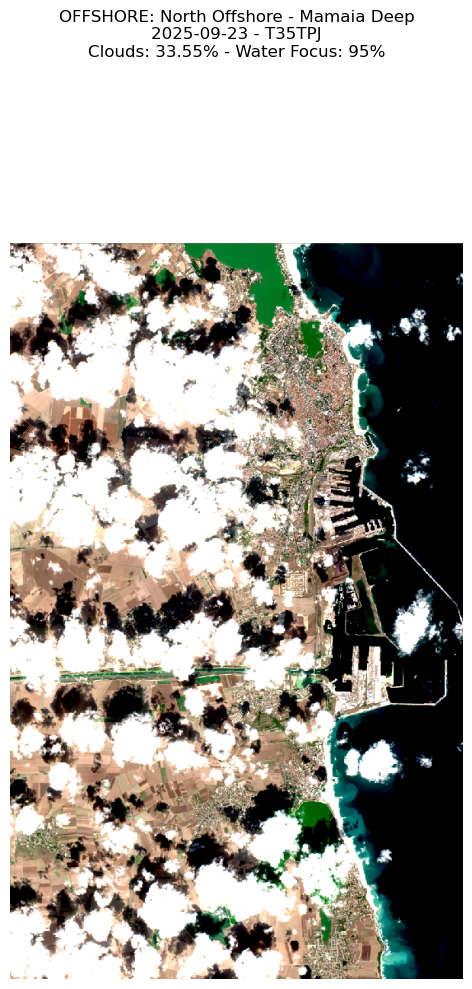

    Saved water_enhanced: water_enhanced_2025-09-23.png
    Saved plastic_detection: plastic_detection_2025-09-23.png
    Saved deep_water: deep_water_2025-09-23.png

 Visualizing: North Offshore - Mamaia Deep - 2025-09-23
   Water focus: 95%
    Saved water-optimized: water_optimized_2025-09-23.png


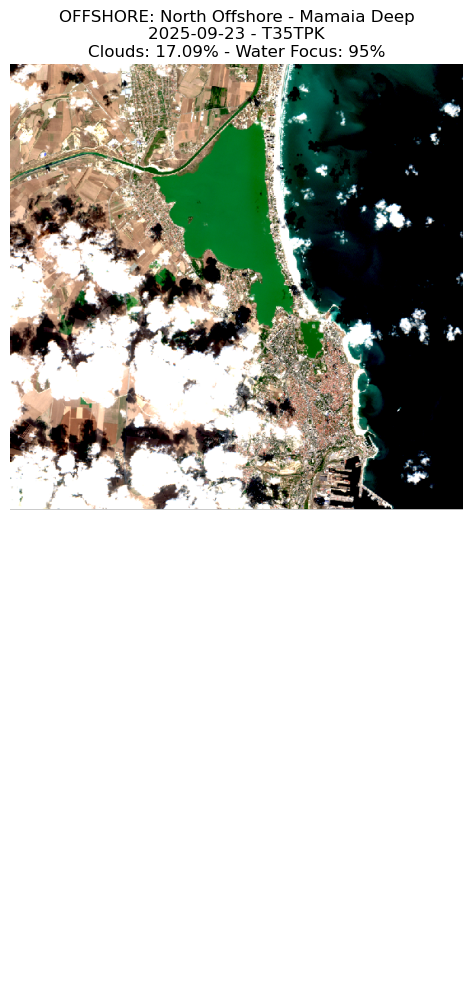

    Saved water_enhanced: water_enhanced_2025-09-23.png
    Saved plastic_detection: plastic_detection_2025-09-23.png
    Saved deep_water: deep_water_2025-09-23.png

 Visualizing: Central Offshore - Port Approach - 2025-09-23
   Water focus: 90%
    Saved water-optimized: water_optimized_2025-09-23.png


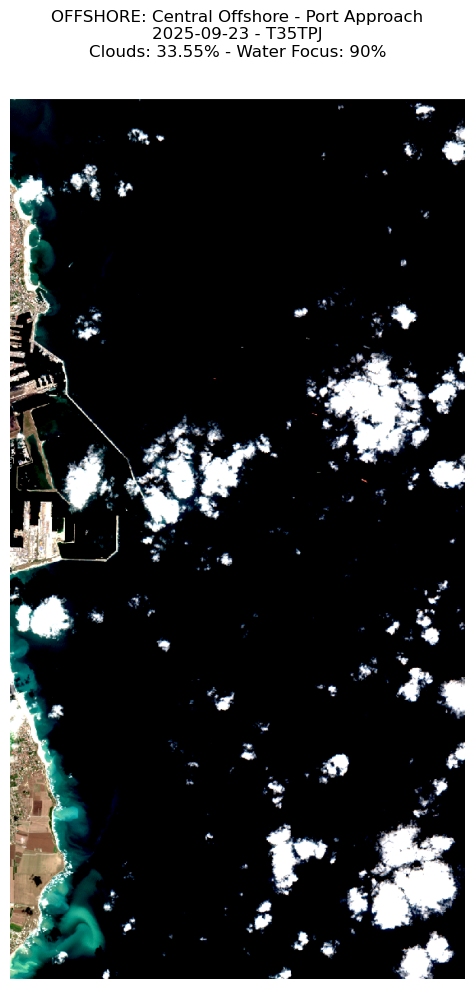

    Saved water_enhanced: water_enhanced_2025-09-23.png
    Saved plastic_detection: plastic_detection_2025-09-23.png
    Saved deep_water: deep_water_2025-09-23.png

 Visualizing: Central Offshore - Port Approach - 2025-09-23
   Water focus: 90%
    Saved water-optimized: water_optimized_2025-09-23.png


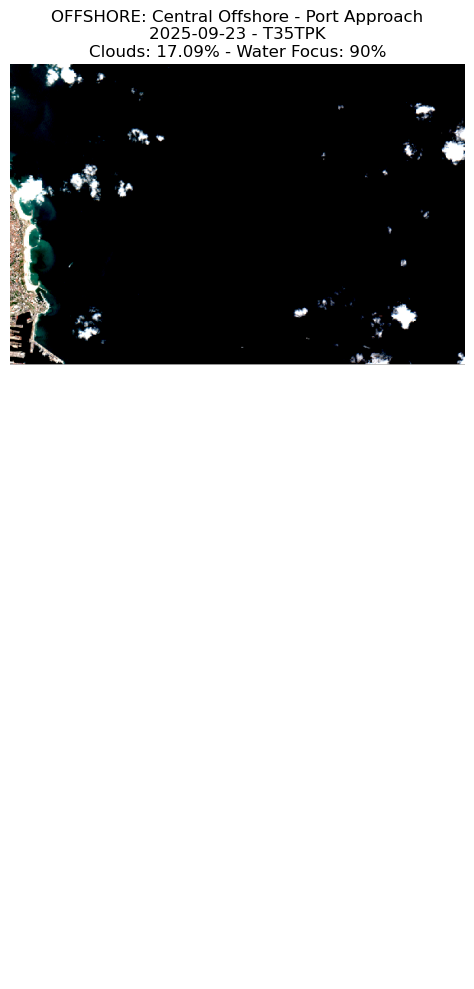

    Saved water_enhanced: water_enhanced_2025-09-23.png
    Saved plastic_detection: plastic_detection_2025-09-23.png
    Saved deep_water: deep_water_2025-09-23.png

 Visualizing: South Offshore - Eforie Deep - 2025-09-23
   Water focus: 96%
    Saved water-optimized: water_optimized_2025-09-23.png


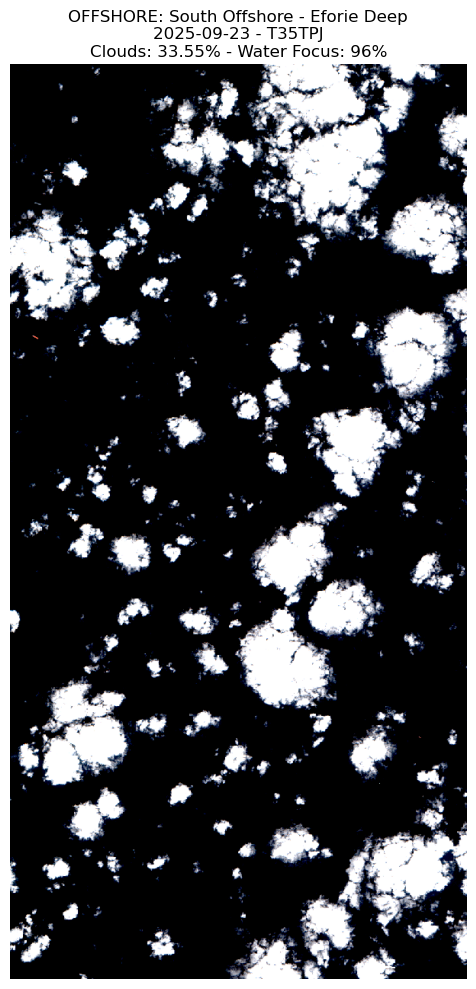

    Saved water_enhanced: water_enhanced_2025-09-23.png
    Saved plastic_detection: plastic_detection_2025-09-23.png
    Saved deep_water: deep_water_2025-09-23.png

 Visualizing: South Offshore - Eforie Deep - 2025-09-23
   Water focus: 96%
    Saved water-optimized: water_optimized_2025-09-23.png


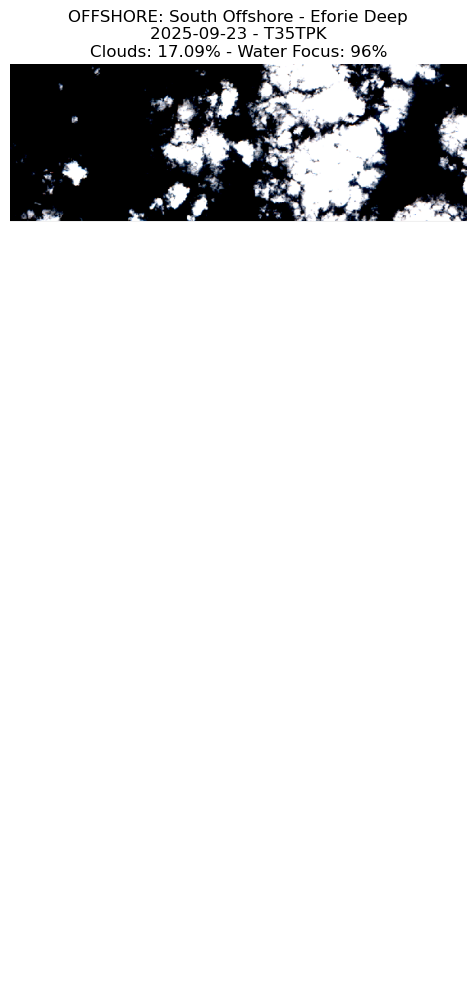

    Saved water_enhanced: water_enhanced_2025-09-23.png
    Saved plastic_detection: plastic_detection_2025-09-23.png
    Saved deep_water: deep_water_2025-09-23.png

 Visualizing: Far South Offshore - 2025-09-23
   Water focus: 98%
    Saved water-optimized: water_optimized_2025-09-23.png


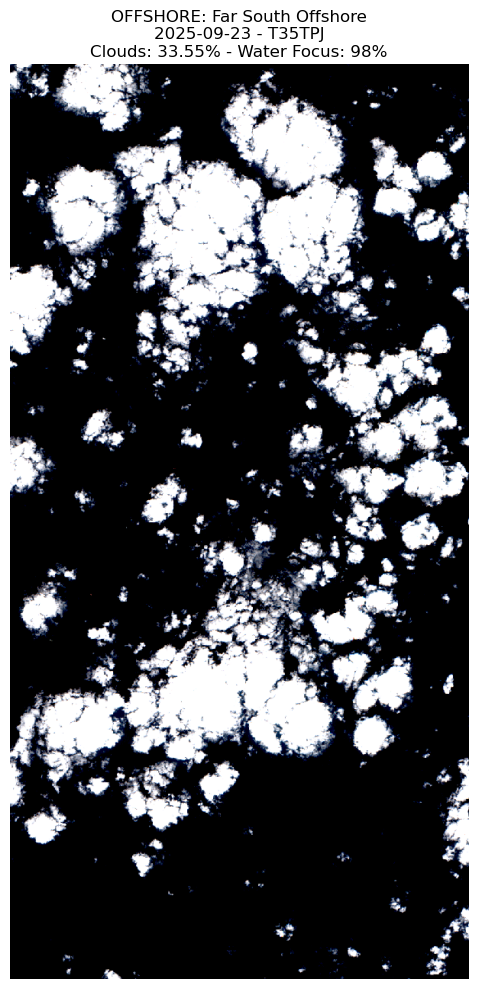

    Saved water_enhanced: water_enhanced_2025-09-23.png
    Saved plastic_detection: plastic_detection_2025-09-23.png
    Saved deep_water: deep_water_2025-09-23.png

 Visualizing: Far South Offshore - 2025-09-23
   Water focus: 98%
    Saved water-optimized: water_optimized_2025-09-23.png


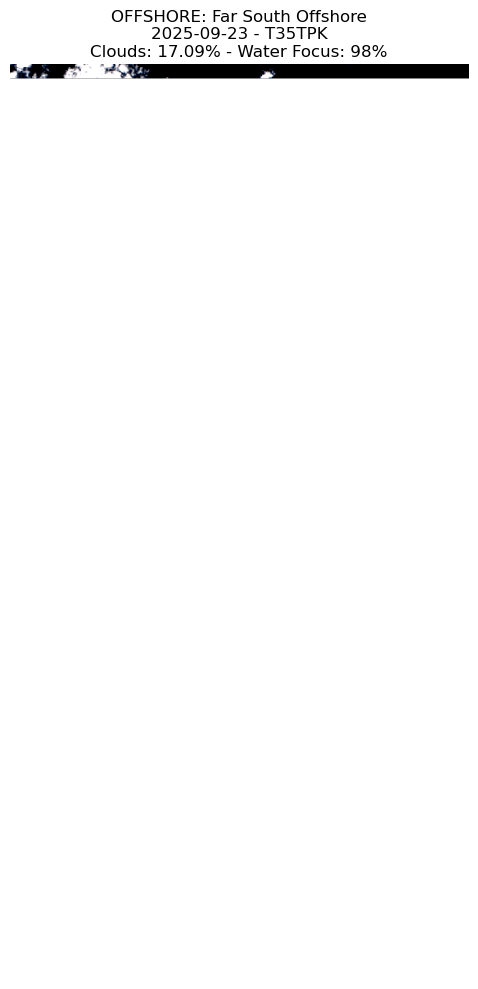

    Saved water_enhanced: water_enhanced_2025-09-23.png
    Saved plastic_detection: plastic_detection_2025-09-23.png
    Saved deep_water: deep_water_2025-09-23.png

 Visualizing: Coastal Transition - Nearshore - 2025-09-23
   Water focus: 70%
    Saved water-optimized: water_optimized_2025-09-23.png


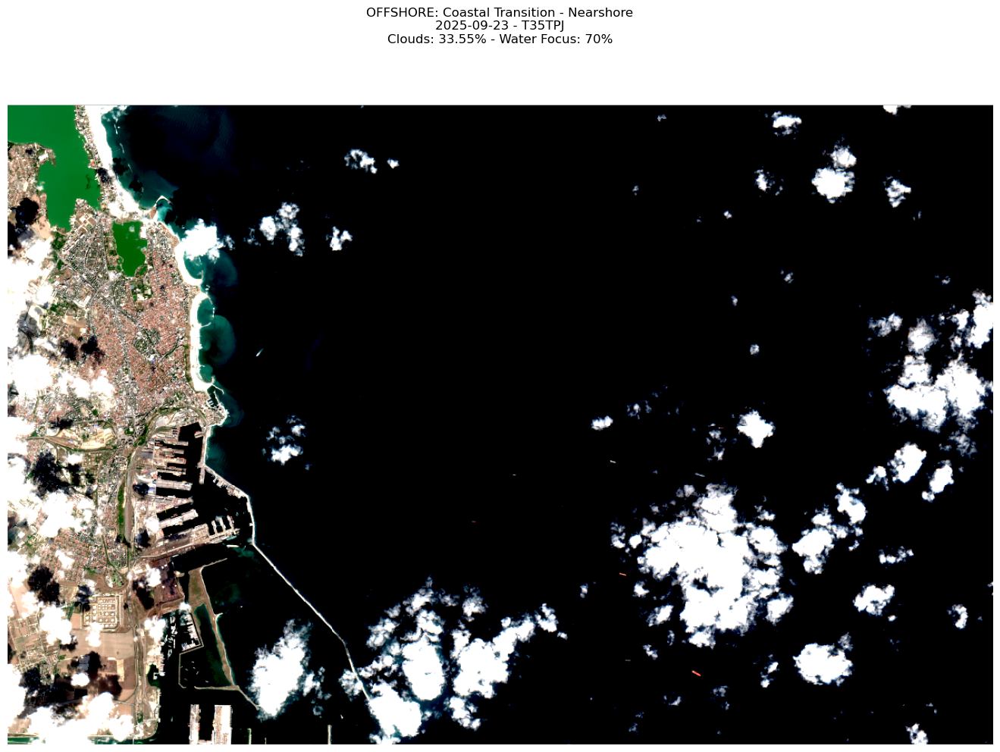

    Saved water_enhanced: water_enhanced_2025-09-23.png
    Saved plastic_detection: plastic_detection_2025-09-23.png
    Saved deep_water: deep_water_2025-09-23.png

 Visualizing: Coastal Transition - Nearshore - 2025-09-23
   Water focus: 70%
    Saved water-optimized: water_optimized_2025-09-23.png


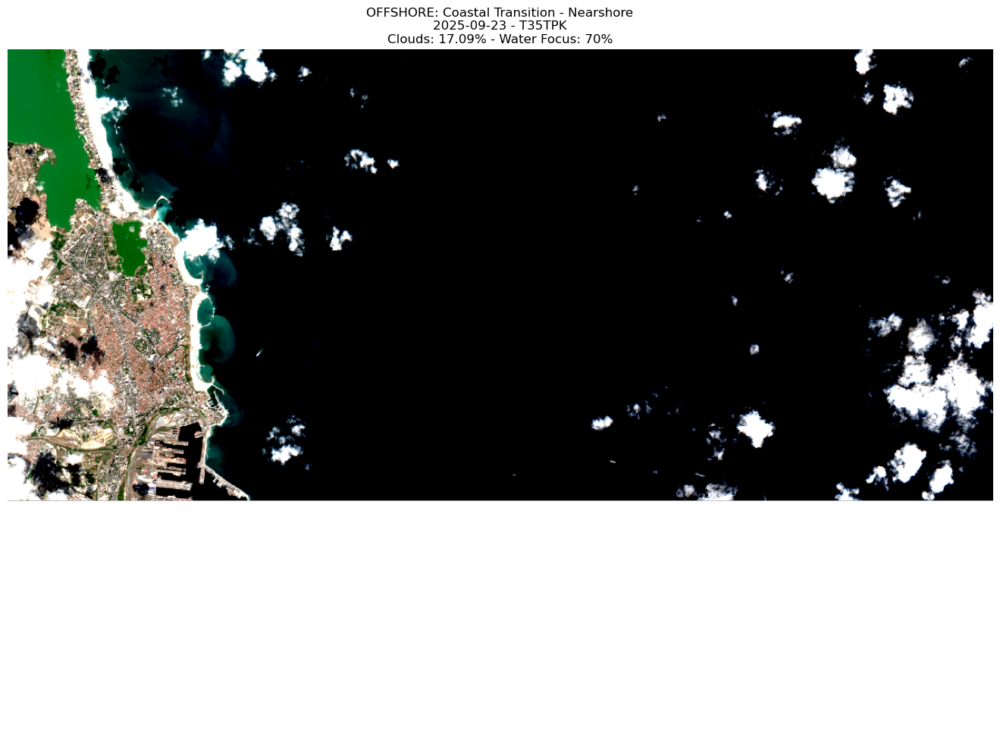

    Saved water_enhanced: water_enhanced_2025-09-23.png
    Saved plastic_detection: plastic_detection_2025-09-23.png
    Saved deep_water: deep_water_2025-09-23.png

 Offshore visualization complete!


In [7]:
# Cell 4: Water-Optimized Visualization for Plastic Detection
def visualize_water_optimized(image_data):
    """Visualize with water-optimized settings for plastic detection"""
    segment = image_data['segment']
    
    print(f"\n Visualizing: {segment['name']} - {image_data['date']}")
    print(f"   Water focus: {segment['water_coverage']:.0%}")
    
    # Create offshore-focused folder structure
    safe_name = segment['name'].replace(' ', '_').replace('-', '_')
    segment_path = os.path.join(dataset_path, "offshore_analysis", safe_name)
    os.makedirs(segment_path, exist_ok=True)
    
    image_folder = os.path.join(segment_path, f"{image_data['date']}_{image_data['tile_id']}")
    os.makedirs(image_folder, exist_ok=True)
    
    # Water-optimized visualization parameters
    water_params = {
        'bands': ['B4', 'B3', 'B2'],  # True color
        'min': 350,    # Lower min for better water detail
        'max': 1800,   # Lower max to enhance water features
        'gamma': 1.6,  # Higher gamma for water contrast
        'region': image_data['roi'],
        'dimensions': 1200,
        'format': 'png'
    }
    
    try:
        # Get and save water-optimized image
        url = image_data['image'].getThumbUrl(water_params)
        response = requests.get(url, timeout=45)
        
        if response.status_code == 200:
            # Save water-optimized image
            filename = f"water_optimized_{image_data['date']}.png"
            filepath = os.path.join(image_folder, filename)
            
            with open(filepath, 'wb') as f:
                f.write(response.content)
            
            print(f"    Saved water-optimized: {filename}")
            
            # Display with water-focused title
            img = Image.open(io.BytesIO(response.content))
            plt.figure(figsize=(14, 10))
            plt.imshow(img)
            plt.title(f"OFFSHORE: {segment['name']}\n"
                     f"{image_data['date']} - {image_data['tile_id']}\n"
                     f"Clouds: {image_data['cloud_cover']:.2f}% - Water Focus: {segment['water_coverage']:.0%}")
            plt.axis('off')
            plt.tight_layout()
            plt.show()
            
            # Save additional water-focused visualizations
            save_water_analysis_visualizations(image_data, image_folder)
            
        else:
            print(f"   ❌ Failed to download water-optimized image")
            
    except Exception as e:
        print(f"   ❌ Visualization error: {e}")

def save_water_analysis_visualizations(image_data, image_folder):
    """Save visualizations optimized for water plastic detection"""
    water_visualizations = [
        {
            'name': 'water_enhanced',
            'bands': ['B3', 'B4', 'B2'],  # Green, Red, Blue - better for water
            'min': 300, 'max': 1600, 'gamma': 1.8
        },
        {
            'name': 'plastic_detection', 
            'bands': ['B8', 'B11', 'B4'],  # NIR, SWIR, Red - good for floating debris
            'min': 400, 'max': 2200, 'gamma': 1.4
        },
        {
            'name': 'deep_water',
            'bands': ['B2', 'B3', 'B4'],  # Standard but optimized for deep water
            'min': 250, 'max': 1400, 'gamma': 2.0
        }
    ]
    
    for vis in water_visualizations:
        try:
            url = image_data['image'].getThumbUrl({
                'bands': vis['bands'],
                'min': vis['min'],
                'max': vis['max'],
                'gamma': vis['gamma'],
                'region': image_data['roi'],
                'dimensions': 800,
                'format': 'png'
            })
            
            response = requests.get(url, timeout=30)
            if response.status_code == 200:
                filename = f"{vis['name']}_{image_data['date']}.png"
                filepath = os.path.join(image_folder, filename)
                
                with open(filepath, 'wb') as f:
                    f.write(response.content)
                
                print(f"    Saved {vis['name']}: {filename}")
                
        except Exception as e:
            print(f"   ❌ Error saving {vis['name']}: {e}")

# Visualize all offshore images
print("\n" + "=" * 60)
print(" WATER-OPTIMIZED VISUALIZATION")
print("=" * 60)

for image_data in all_offshore_data:
    visualize_water_optimized(image_data)

print(f"\n Offshore visualization complete!")

In [9]:
# Cell 5: Offshore Coverage Analysis Report (FIXED)
def create_offshore_coverage_report(all_offshore_data):
    """Create offshore-focused coverage report"""
    print("\n" + "=" * 60)
    print("  OFFSHORE COVERAGE ANALYSIS")
    print("=" * 60)

    # Create offshore summary
    summary = {
        'report_type': 'offshore_plastic_detection',
        'generation_date': datetime.now().isoformat(),
        'search_period': f"{start_date} to {end_date}",
        'total_offshore_images': len(all_offshore_data),
        'water_focused_segments': len(constanta_segments),
        'offshore_coverage_details': []
    }

    # Add details for each image
    for img_data in all_offshore_data:
        summary['offshore_coverage_details'].append({
            'segment': img_data['segment']['name'],
            'date': img_data['date'],
            'tile': img_data['tile_id'],
            'cloud_cover': img_data['cloud_cover'],
            'water_focus': img_data['segment']['water_coverage'],
            'coordinates': img_data['segment']['coords']
        })

    # Analyze water coverage
    total_water_focus = sum(segment['water_coverage'] for segment in constanta_segments)
    average_water_focus = total_water_focus / len(constanta_segments)

    print(f" WATER FOCUS ANALYSIS:")
    print(f"   Average water coverage: {average_water_focus:.1%}")
    print(f"   Total offshore images: {len(all_offshore_data)}")
    print(f"   Segments covered: {len(constanta_segments)}")

    print(f"\n OFFSHORE SEGMENTS:")
    for segment in constanta_segments:
        segment_images = [img for img in all_offshore_data if img['segment']['name'] == segment['name']]
        status = "✓" if segment_images else "❌"
        print(f"   {status} {segment['name']}")
        print(f"      Water focus: {segment['water_coverage']:.0%}")
        print(f"      Images: {len(segment_images)}")
        print(f"      Target: {segment['focus']}")

    # Save comprehensive report
    report_file = os.path.join(dataset_path, "offshore_coverage_report.json")
    with open(report_file, 'w') as f:
        json.dump(summary, f, indent=2)

    print(f"\n Full report saved: {report_file}")

    print(f"\n OFFSHORE PLASTIC DETECTION STRATEGY:")
    print("   • Vertical segments extend 30+km offshore")
    print("   • Focus on plastic accumulation zones")
    print("   • Optimized for water analysis")
    print("   • Covers shipping lanes and current patterns")

    print(f"\n Offshore analysis complete!")
    print(f" All data in: {dataset_path}")

# Generate the offshore coverage report
create_offshore_coverage_report(all_offshore_data)


  OFFSHORE COVERAGE ANALYSIS
 WATER FOCUS ANALYSIS:
   Average water coverage: 89.8%
   Total offshore images: 10
   Segments covered: 5

 OFFSHORE SEGMENTS:
   ✓ North Offshore - Mamaia Deep
      Water focus: 95%
      Images: 2
      Target: Deep water plastic accumulation north of Constanta
   ✓ Central Offshore - Port Approach
      Water focus: 90%
      Images: 2
      Target: Shipping lanes and port approach plastic
   ✓ South Offshore - Eforie Deep
      Water focus: 96%
      Images: 2
      Target: Deep water plastic south of Constanta
   ✓ Far South Offshore
      Water focus: 98%
      Images: 2
      Target: Far southern plastic accumulation zone
   ✓ Coastal Transition - Nearshore
      Water focus: 70%
      Images: 2
      Target: Land-water interface plastic accumulation

 Full report saved: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\offshore_coverage_report.json

 OFFSHORE PLASTIC DETECTION STRATEGY:
   • Vertical segmen

 PLASTIC DETECTION HEATMAP WITH LAND MASKING
 Creating land-masked plastic detection heatmaps...

 Generating land-masked heatmap: North Offshore - Mamaia Deep - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


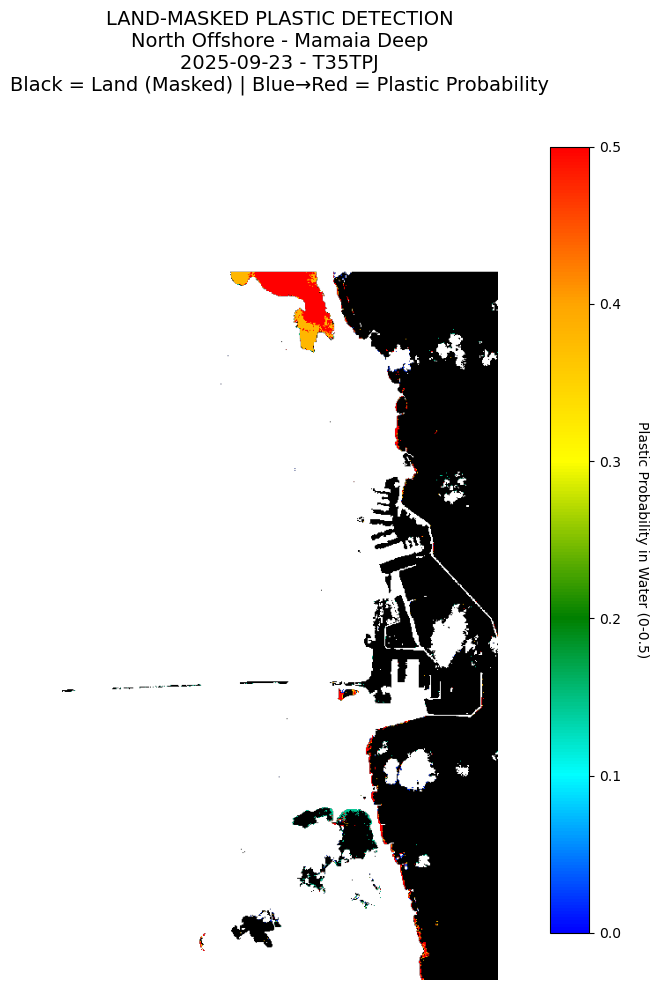

    Saved transparent heatmap: transparent_heatmap_2025-09-23.png
    Water-only stats: Mean=0.035, Water coverage=24.2%

 Generating land-masked heatmap: North Offshore - Mamaia Deep - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


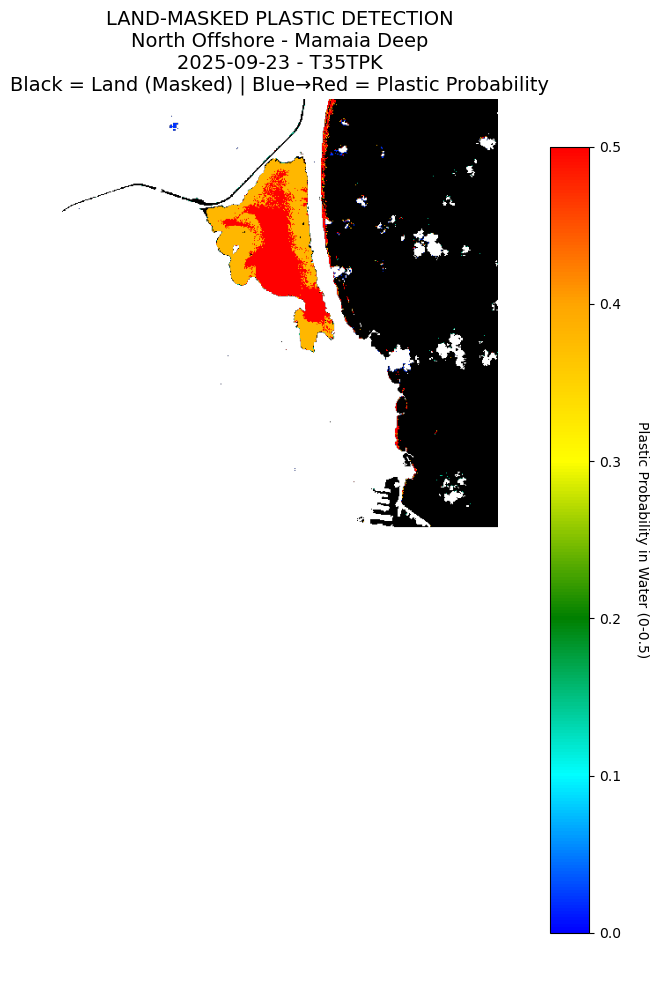

    Saved transparent heatmap: transparent_heatmap_2025-09-23.png
    Water-only stats: Mean=0.109, Water coverage=35.7%

 Generating land-masked heatmap: Central Offshore - Port Approach - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


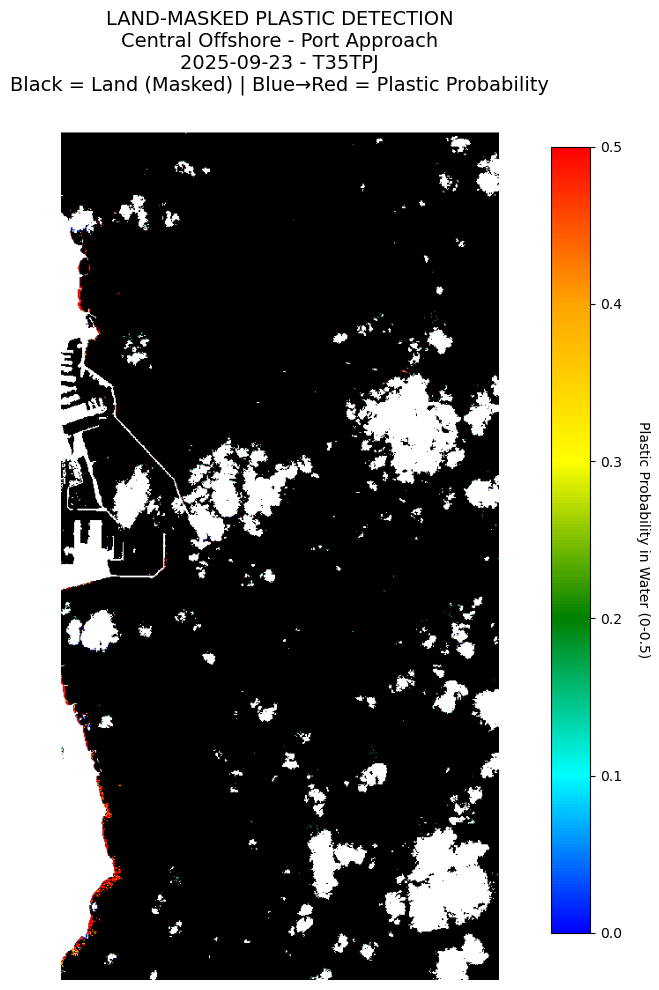

    Saved transparent heatmap: transparent_heatmap_2025-09-23.png
    Water-only stats: Mean=0.002, Water coverage=86.2%

 Generating land-masked heatmap: Central Offshore - Port Approach - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


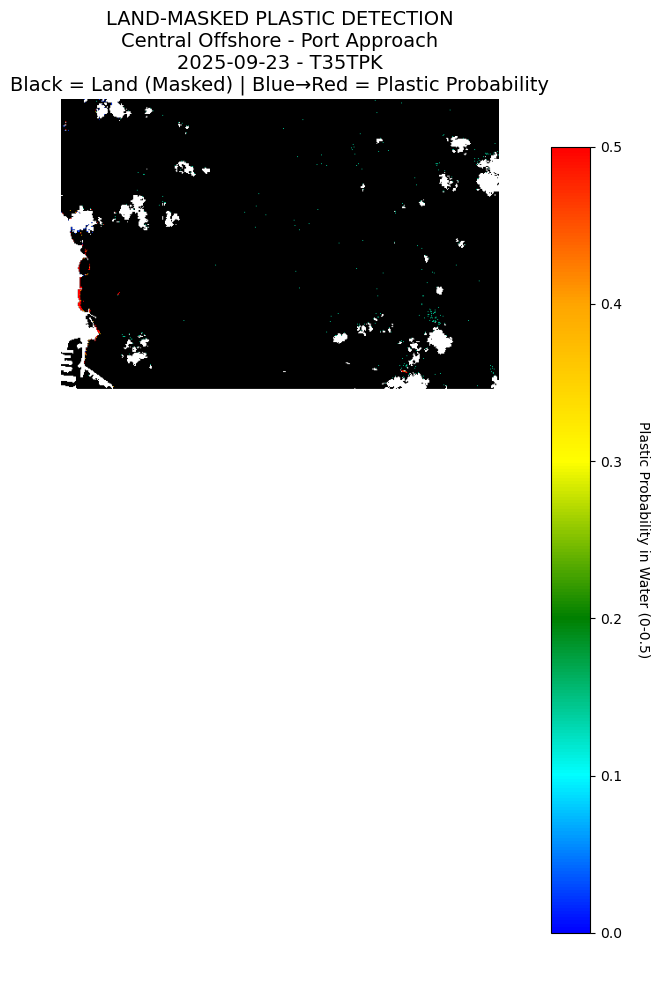

    Saved transparent heatmap: transparent_heatmap_2025-09-23.png
    Water-only stats: Mean=0.001, Water coverage=94.8%

 Generating land-masked heatmap: South Offshore - Eforie Deep - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


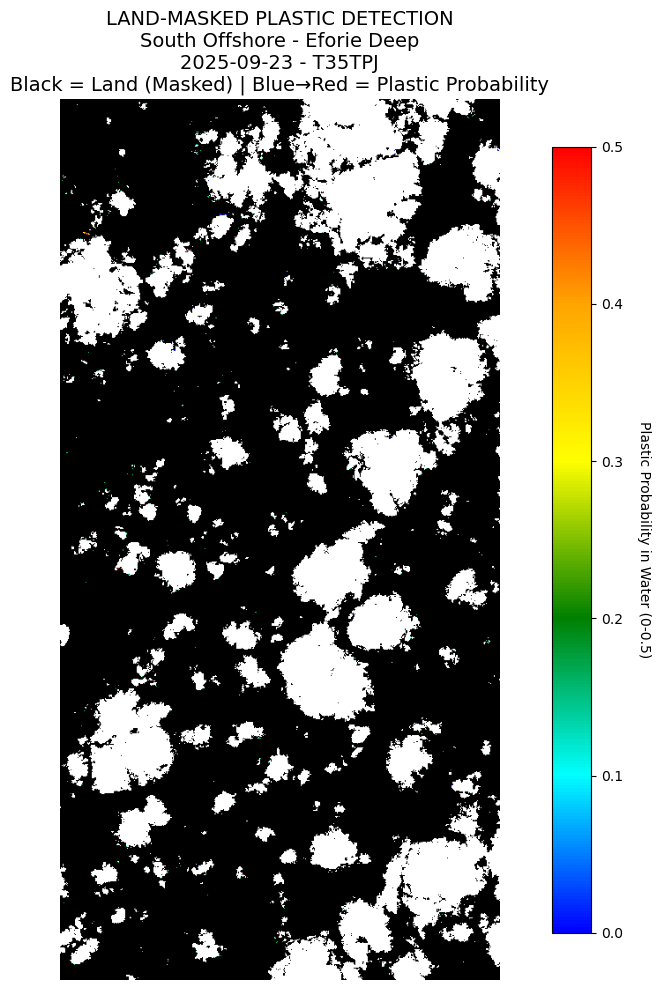

    Saved transparent heatmap: transparent_heatmap_2025-09-23.png
    Water-only stats: Mean=0.000, Water coverage=71.2%

 Generating land-masked heatmap: South Offshore - Eforie Deep - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


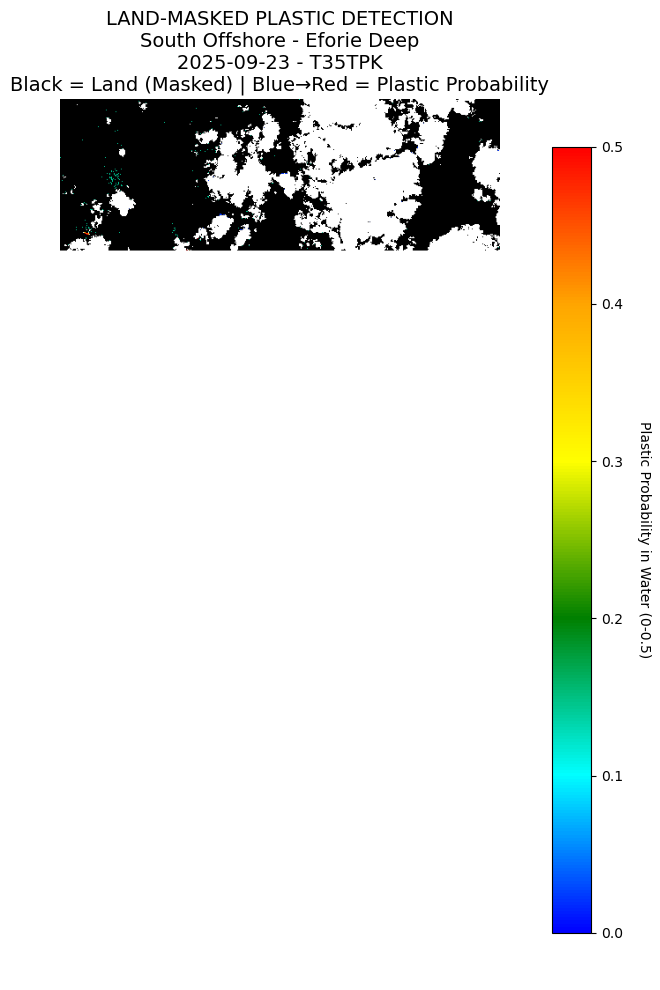

    Saved transparent heatmap: transparent_heatmap_2025-09-23.png
    Water-only stats: Mean=0.000, Water coverage=60.0%

 Generating land-masked heatmap: Far South Offshore - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


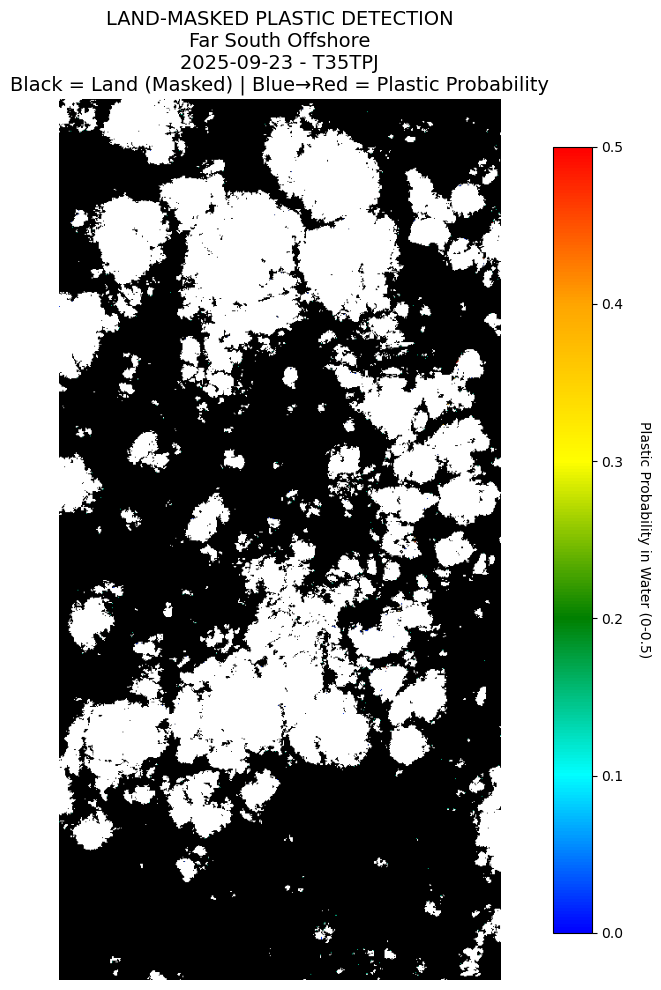

    Saved transparent heatmap: transparent_heatmap_2025-09-23.png
    Water-only stats: Mean=0.000, Water coverage=63.7%

 Generating land-masked heatmap: Far South Offshore - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


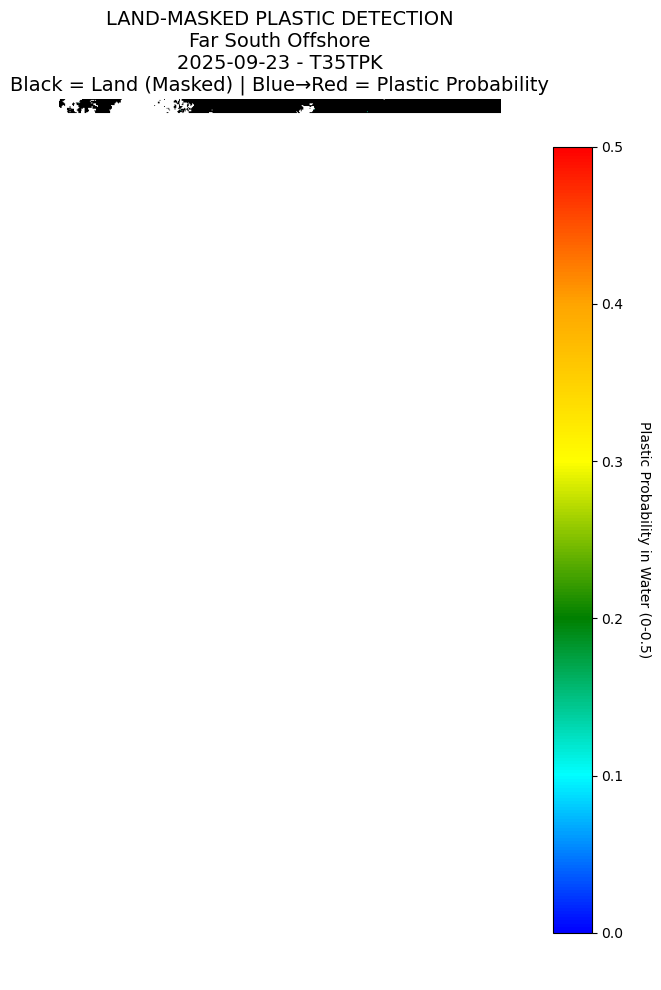

    Saved transparent heatmap: transparent_heatmap_2025-09-23.png
    Water-only stats: Mean=0.000, Water coverage=82.2%

 Generating land-masked heatmap: Coastal Transition - Nearshore - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


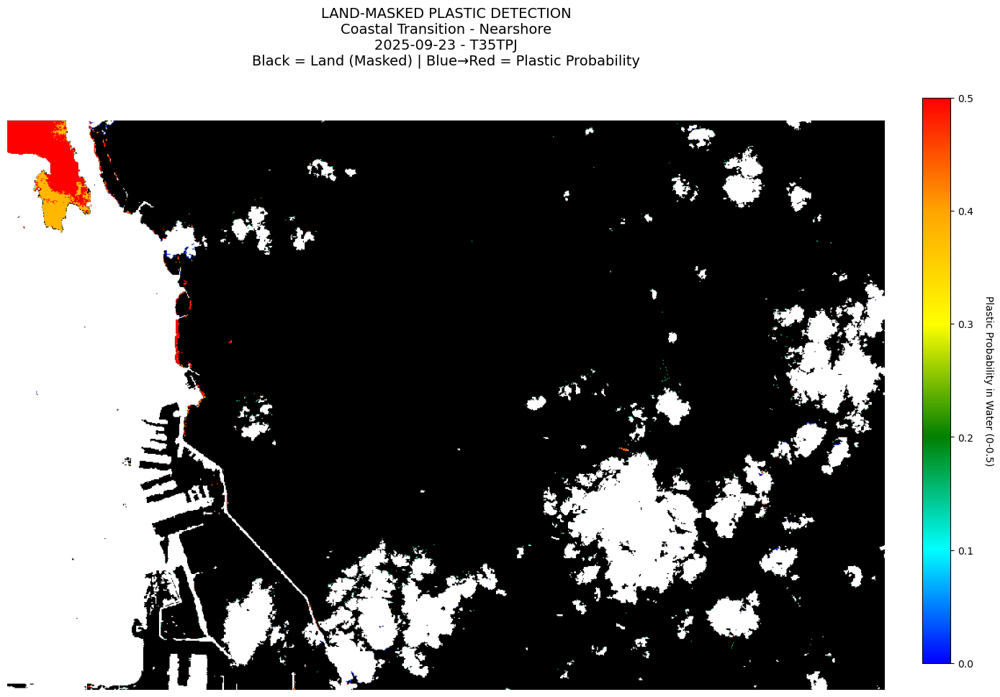

    Saved transparent heatmap: transparent_heatmap_2025-09-23.png
    Water-only stats: Mean=0.009, Water coverage=73.1%

 Generating land-masked heatmap: Coastal Transition - Nearshore - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


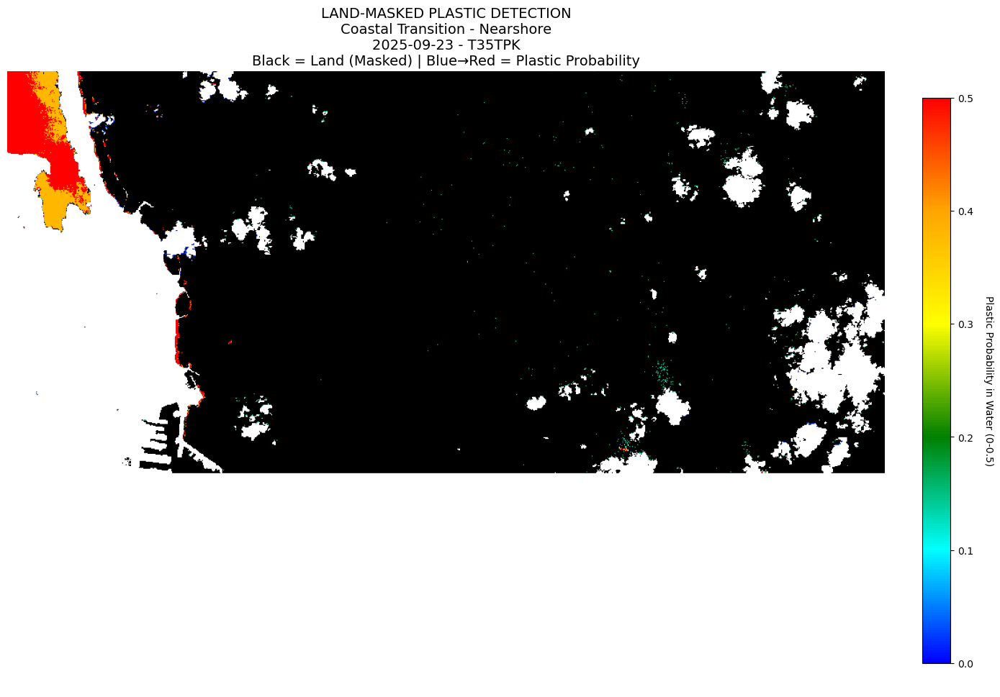

    Saved transparent heatmap: transparent_heatmap_2025-09-23.png
    Water-only stats: Mean=0.015, Water coverage=80.7%

 Land-masked heatmap generation: 10/10 successful

 Creating composite masked heatmap...

🔗 GENERATING COMPOSITE MASKED HEATMAP


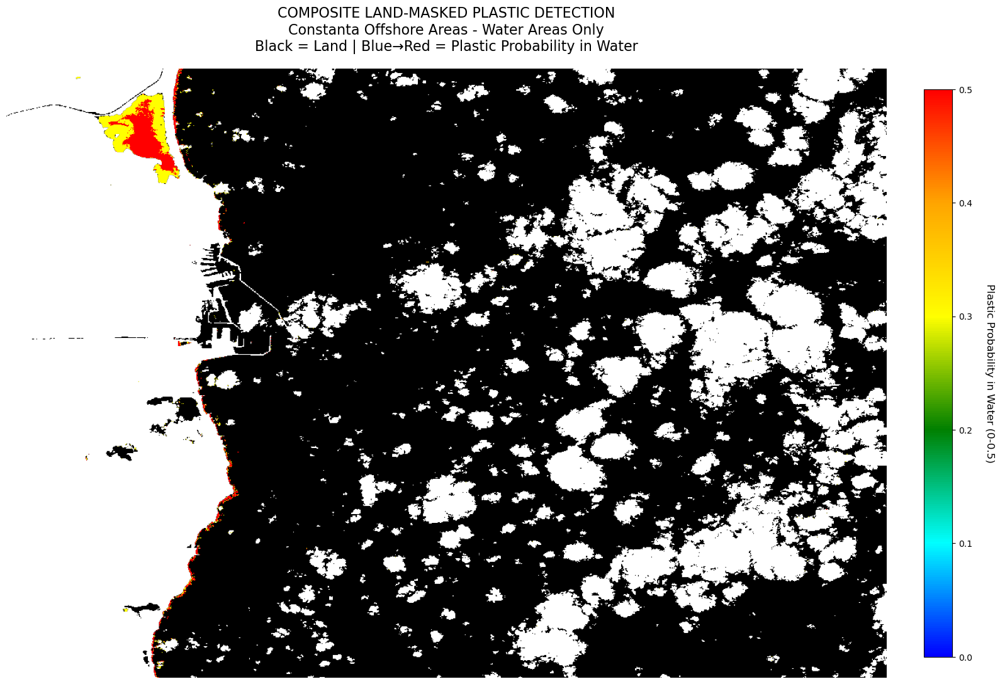

    Saved composite masked heatmap: composite_masked_plastic_heatmap.png

 Land-masked plastic detection complete!
 All heatmaps saved to: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps
 Now focusing only on water areas for plastic detection
 Black areas = Land (masked out)
 Colored areas = Water with plastic probability


In [11]:
# Cell 6: Plastic Detection Heatmap with Land Masking
print("=" * 60)
print(" PLASTIC DETECTION HEATMAP WITH LAND MASKING")
print("=" * 60)

# Import for colorbar
from matplotlib.colors import LinearSegmentedColormap

def create_plastic_heatmap_land_masked(image_data):
    """Create heatmap visualization with land masking"""
    segment = image_data['segment']
    
    print(f"\n Generating land-masked heatmap: {segment['name']} - {image_data['date']}")
    
    try:
        # Apply MARLISAT-inspired plastic detection algorithm
        image = image_data['image']
        
        # Calculate indices for plastic detection
        ndwi = image.normalizedDifference(['B3', 'B8']).rename('NDWI')  # Water mask
        
        # Create robust water mask (NDWI > 0.1 = water)
        water_mask = ndwi.gt(0.1).rename('water_mask')
        
        # Calculate FDI for plastic detection
        fdi = image.expression(
            'B8 - (B11 + (B12 - B11) * ((833 - 664) / (1610 - 664)))',
            {'B8': image.select('B8'), 'B11': image.select('B11'), 'B12': image.select('B12')}
        ).rename('FDI')
        
        # Plastic detection algorithm (water-masked)
        plastic_probability = image.expression(
            '((FDI > 150) * 0.4 + '                    # FDI contribution
            '(B8 - B11 > 250) * 0.3 + '               # NIR-SWIR difference  
            '(B8 / B4 > 1.2) * 0.2 + '                # NIR/Red ratio
            '(B8 > 800) * 0.1)'                       # Brightness
            ,
            {
                'B4': image.select('B4'),
                'B8': image.select('B8'),
                'B11': image.select('B11'),
                'FDI': fdi
            }
        ).rename('plastic_probability').clamp(0, 1)  # Ensure 0-1 range
        
        # Apply water mask to remove land
        plastic_probability_masked = plastic_probability.updateMask(water_mask)
        
        # Create heatmap folder
        safe_name = segment['name'].replace(' ', '_').replace('-', '_')
        heatmap_path = os.path.join(dataset_path, "plastic_heatmaps", safe_name)
        os.makedirs(heatmap_path, exist_ok=True)
        
        # Generate heatmap visualization with land masking
        heatmap_params = {
            'bands': ['plastic_probability'],
            'min': 0,
            'max': 0.5,
            'palette': ['000000', 'blue', 'cyan', 'green', 'yellow', 'orange', 'red'],  # Black for masked areas
            'region': image_data['roi'],
            'dimensions': 1000,
            'format': 'png'
        }
        
        url = plastic_probability_masked.getThumbUrl(heatmap_params)
        response = requests.get(url, timeout=45)
        
        if response.status_code == 200:
            # Save heatmap
            filename = f"plastic_heatmap_masked_{image_data['date']}_{image_data['tile_id']}.png"
            filepath = os.path.join(heatmap_path, filename)
            
            with open(filepath, 'wb') as f:
                f.write(response.content)
            
            print(f"    Saved land-masked heatmap: {filename}")
            
            # Display the heatmap
            img = Image.open(io.BytesIO(response.content))
            plt.figure(figsize=(14, 10))
            plt.imshow(img)
            plt.title(f"LAND-MASKED PLASTIC DETECTION\n{segment['name']}\n"
                     f"{image_data['date']} - {image_data['tile_id']}\n"
                     f"Black = Land (Masked) | Blue→Red = Plastic Probability", fontsize=14)
            plt.axis('off')
            
            # Add colorbar legend (excluding black for land)
            water_colors = ['blue', 'cyan', 'green', 'yellow', 'orange', 'red']
            cmap = LinearSegmentedColormap.from_list('water_cmap', water_colors)
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, 0.5))
            sm.set_array([])
            cbar = plt.colorbar(sm, ax=plt.gca(), fraction=0.03, pad=0.04)
            cbar.set_label('Plastic Probability in Water (0-0.5)', rotation=270, labelpad=20)
            
            plt.tight_layout()
            plt.show()
            
            # Also create a version with transparent background for better overlay
            create_transparent_heatmap(plastic_probability_masked, image_data, heatmap_path)
            
            # Save quantitative analysis (water areas only)
            plastic_stats = plastic_probability_masked.reduceRegion(
                reducer=ee.Reducer.mean().combine(
                    reducer2=ee.Reducer.max(),
                    sharedInputs=True
                ).combine(
                    reducer2=ee.Reducer.min(),
                    sharedInputs=True
                ),
                geometry=image_data['roi'],
                scale=100,
                maxPixels=1e8,
                bestEffort=True
            ).getInfo()
            
            # Calculate water area statistics
            water_area = water_mask.reduceRegion(
                reducer=ee.Reducer.mean(),
                geometry=image_data['roi'],
                scale=100,
                maxPixels=1e8,
                bestEffort=True
            ).getInfo()
            
            stats_data = {
                'date': image_data['date'],
                'segment': segment['name'],
                'mean_probability': plastic_stats.get('plastic_probability_mean', 0),
                'max_probability': plastic_stats.get('plastic_probability_max', 0),
                'min_probability': plastic_stats.get('plastic_probability_min', 0),
                'water_coverage': water_area.get('water_mask', 0),
                'analysis_area_km2': image_data['roi'].area().getInfo() / 1e6,
                'heatmap_file': filename
            }
            
            stats_file = os.path.join(heatmap_path, f"stats_masked_{image_data['date']}.json")
            with open(stats_file, 'w') as f:
                json.dump(stats_data, f, indent=2)
            
            print(f"    Water-only stats: Mean={stats_data['mean_probability']:.3f}, "
                  f"Water coverage={stats_data['water_coverage']:.1%}")
            
            return True
            
        else:
            print(f"   ❌ Failed to generate masked heatmap")
            return False
            
    except Exception as e:
        print(f"   ❌ Masked heatmap generation error: {e}")
        return False

def create_transparent_heatmap(plastic_prob_masked, image_data, heatmap_path):
    """Create heatmap with transparent background for overlays"""
    try:
        # Create heatmap with transparent background (using PNG alpha channel)
        transparent_params = {
            'bands': ['plastic_probability'],
            'min': 0,
            'max': 0.5,
            'palette': ['00000000', '0000FF', '00FFFF', '00FF00', 'FFFF00', 'FFA500', 'FF0000'],  # Transparent black
            'region': image_data['roi'],
            'dimensions': 1000,
            'format': 'png',
            'transparent': False
        }
        
        url = plastic_prob_masked.getThumbUrl(transparent_params)
        response = requests.get(url, timeout=45)
        
        if response.status_code == 200:
            filename = f"transparent_heatmap_{image_data['date']}.png"
            filepath = os.path.join(heatmap_path, filename)
            
            with open(filepath, 'wb') as f:
                f.write(response.content)
            
            print(f"    Saved transparent heatmap: {filename}")
            
    except Exception as e:
        print(f"   ⚠️  Transparent heatmap error: {e}")

def generate_composite_masked_heatmap(all_offshore_data):
    """Generate composite heatmap with land masking"""
    print(f"\n🔗 GENERATING COMPOSITE MASKED HEATMAP")
    
    try:
        # Create list of masked plastic probability images
        plastic_images_masked = []
        
        for img_data in all_offshore_data:
            image = img_data['image']
            
            # Calculate water mask
            ndwi = image.normalizedDifference(['B3', 'B8']).rename('NDWI')
            water_mask = ndwi.gt(0.1)
            
            # Calculate plastic probability
            fdi = image.expression(
                'B8 - (B11 + (B12 - B11) * ((833 - 664) / (1610 - 664)))',
                {'B8': image.select('B8'), 'B11': image.select('B11'), 'B12': image.select('B12')}
            ).rename('FDI')
            
            plastic_prob = image.expression(
                "((FDI > 150) + (B8 - B11 > 250) + (B8 > 800)) / 3",
                {'FDI': fdi, 'B8': image.select('B8'), 'B11': image.select('B11')}
            ).rename('plastic_prob').clamp(0, 1)
            
            # Apply water mask
            plastic_prob_masked = plastic_prob.updateMask(water_mask)
            plastic_images_masked.append(plastic_prob_masked)
        
        if plastic_images_masked:
            # Create mosaic of all masked plastic probability images
            composite_masked = ee.ImageCollection(plastic_images_masked).mosaic()
            
            # Generate composite heatmap with land masking
            composite_params = {
                'bands': ['plastic_prob'],
                'min': 0,
                'max': 0.5,
                'palette': ['000000', 'blue', 'cyan', 'green', 'yellow', 'orange', 'red'],
                'dimensions': 1200,
                'format': 'png'
            }
            
            # Use the union of all ROIs
            all_rois = ee.Geometry.MultiPolygon([img_data['roi'] for img_data in all_offshore_data])
            composite_params['region'] = all_rois
            
            url = composite_masked.getThumbUrl(composite_params)
            response = requests.get(url, timeout=60)
            
            if response.status_code == 200:
                # Save composite heatmap
                composite_path = os.path.join(dataset_path, "plastic_heatmaps", "composite_masked")
                os.makedirs(composite_path, exist_ok=True)
                
                filename = "composite_masked_plastic_heatmap.png"
                filepath = os.path.join(composite_path, filename)
                
                with open(filepath, 'wb') as f:
                    f.write(response.content)
                
                # Display composite
                img = Image.open(io.BytesIO(response.content))
                plt.figure(figsize=(16, 12))
                plt.imshow(img)
                plt.title("COMPOSITE LAND-MASKED PLASTIC DETECTION\n"
                         "Constanta Offshore Areas - Water Areas Only\n"
                         "Black = Land | Blue→Red = Plastic Probability in Water", 
                         fontsize=16, pad=20)
                plt.axis('off')
                
                # Add legend
                water_colors = ['blue', 'cyan', 'green', 'yellow', 'orange', 'red']
                cmap = LinearSegmentedColormap.from_list('water_cmap', water_colors)
                sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, 0.5))
                sm.set_array([])
                cbar = plt.colorbar(sm, ax=plt.gca(), fraction=0.03, pad=0.04)
                cbar.set_label('Plastic Probability in Water (0-0.5)', rotation=270, labelpad=25, fontsize=12)
                
                plt.tight_layout()
                plt.show()
                
                print(f"    Saved composite masked heatmap: {filename}")
                return True
                
    except Exception as e:
        print(f"   ❌ Composite masked heatmap error: {e}")
        return False

# Generate land-masked heatmaps
print(" Creating land-masked plastic detection heatmaps...")

heatmap_success = 0
for image_data in all_offshore_data:
    success = create_plastic_heatmap_land_masked(image_data)
    if success:
        heatmap_success += 1

print(f"\n Land-masked heatmap generation: {heatmap_success}/{len(all_offshore_data)} successful")

# Generate composite masked heatmap
if len(all_offshore_data) > 1:
    print(f"\n Creating composite masked heatmap...")
    generate_composite_masked_heatmap(all_offshore_data)

print(f"\n Land-masked plastic detection complete!")
print(f" All heatmaps saved to: {os.path.join(dataset_path, 'plastic_heatmaps')}")
print(f" Now focusing only on water areas for plastic detection")
print(f" Black areas = Land (masked out)")
print(f" Colored areas = Water with plastic probability")

Creating land-masked plastic detection heatmaps...

Generating land-masked heatmap: North Offshore - Mamaia Deep - 2025-09-23
Saved heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


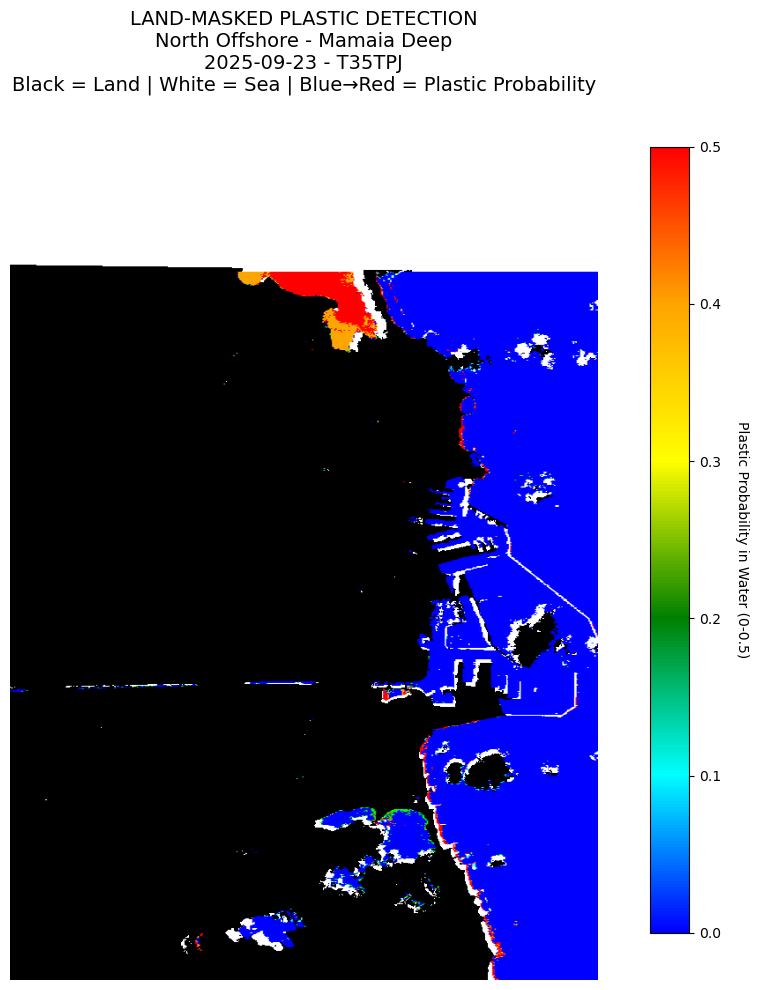


Generating land-masked heatmap: North Offshore - Mamaia Deep - 2025-09-23
Saved heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


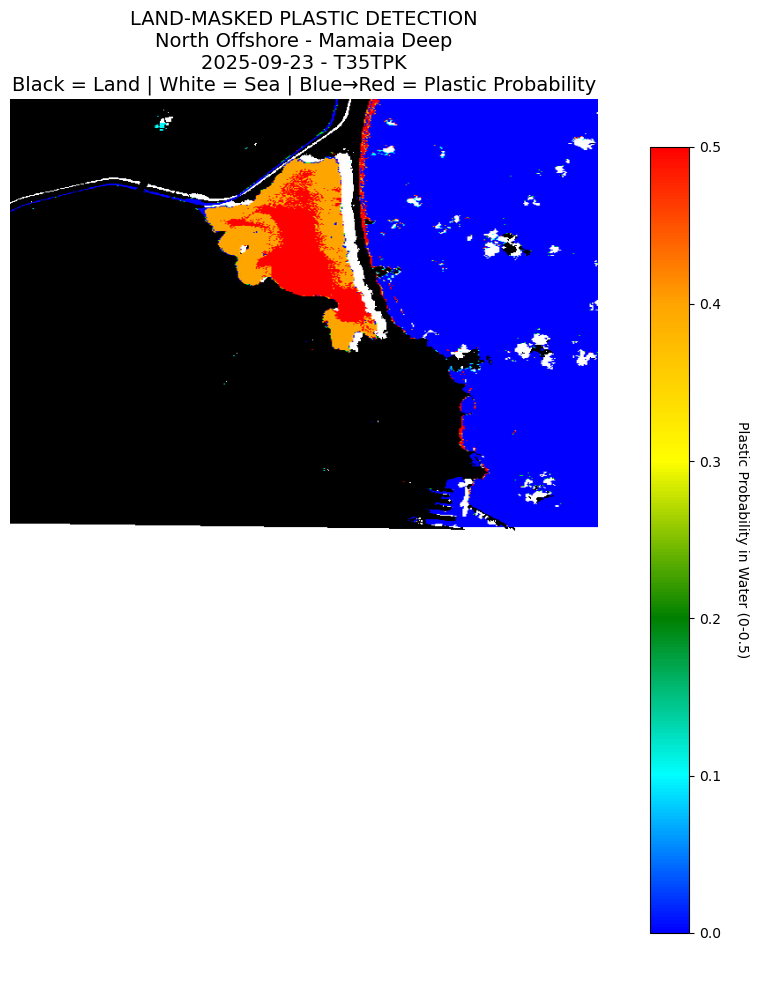


Generating land-masked heatmap: Central Offshore - Port Approach - 2025-09-23
Saved heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


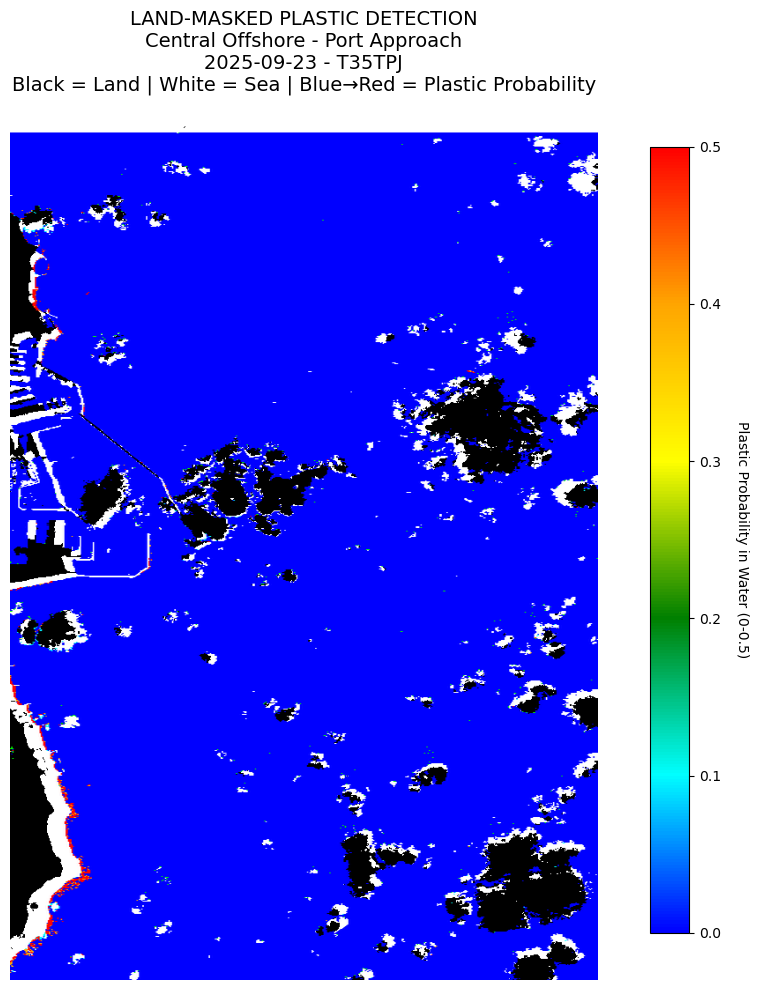


Generating land-masked heatmap: Central Offshore - Port Approach - 2025-09-23
Saved heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


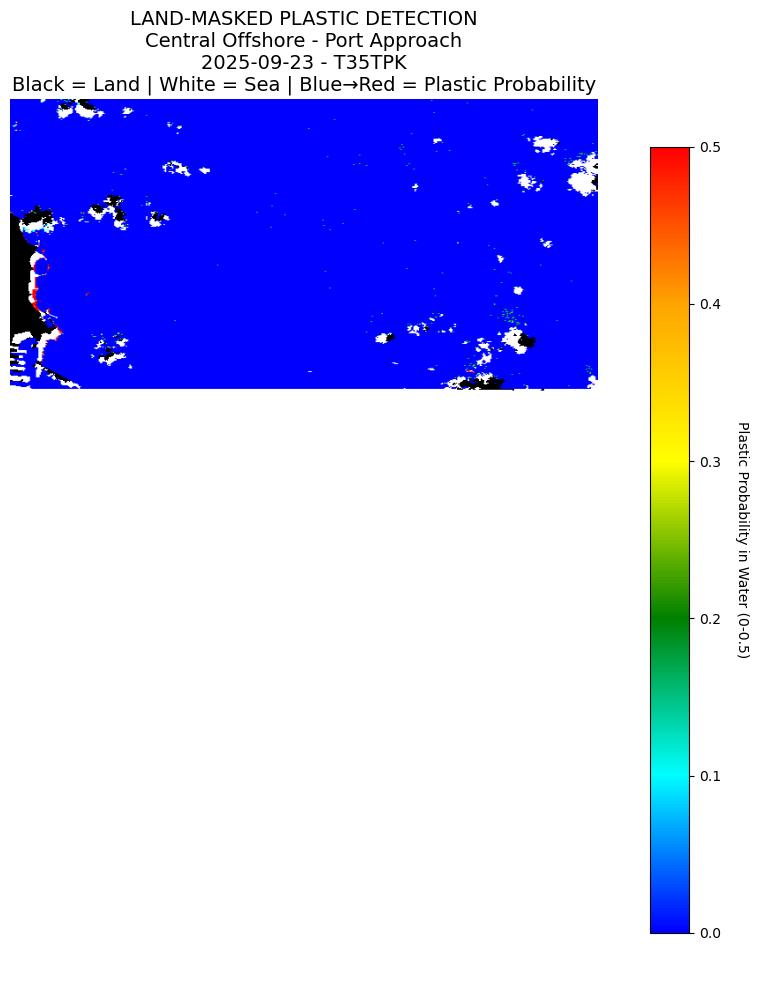


Generating land-masked heatmap: South Offshore - Eforie Deep - 2025-09-23
Saved heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


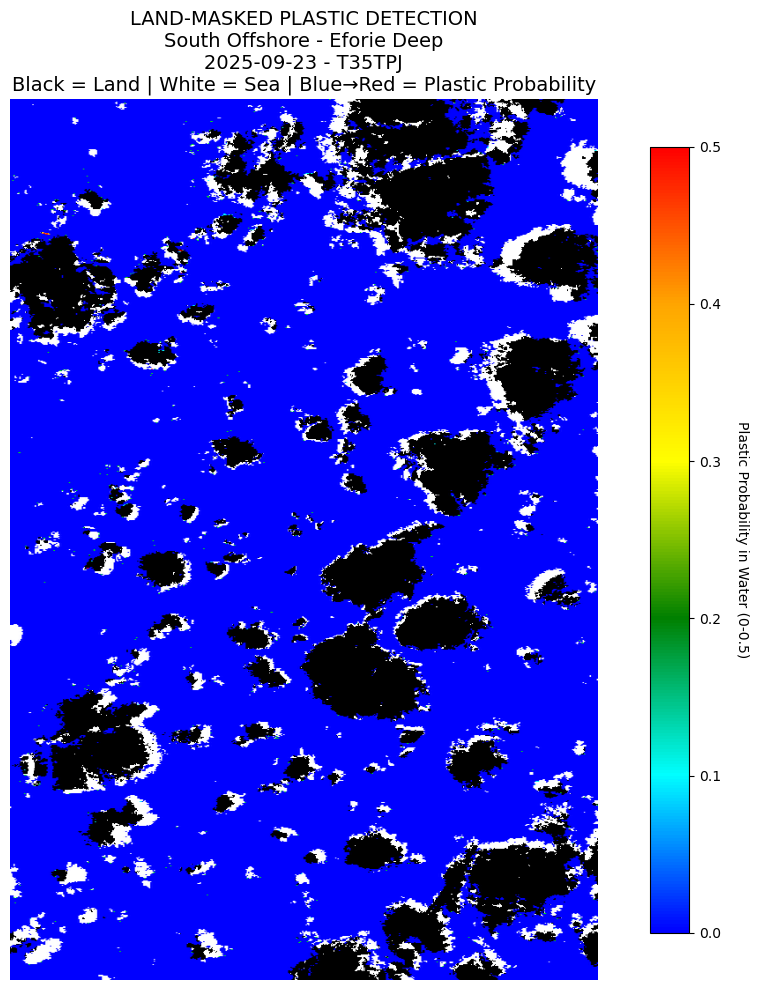


Generating land-masked heatmap: South Offshore - Eforie Deep - 2025-09-23
Saved heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


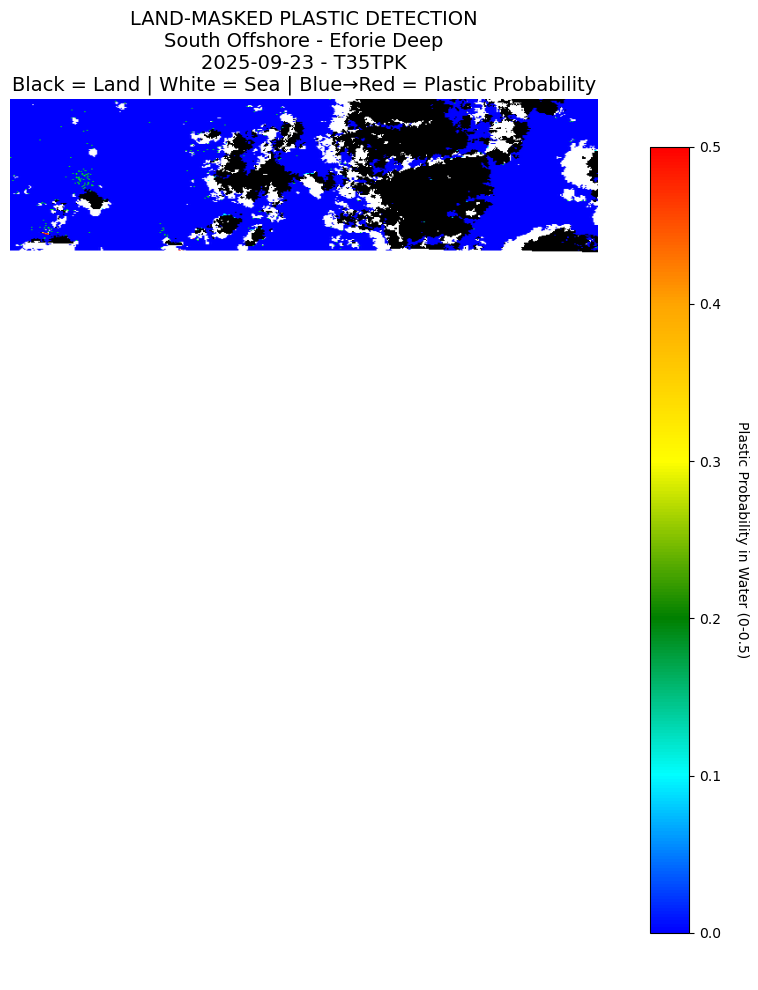


Generating land-masked heatmap: Far South Offshore - 2025-09-23
Saved heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


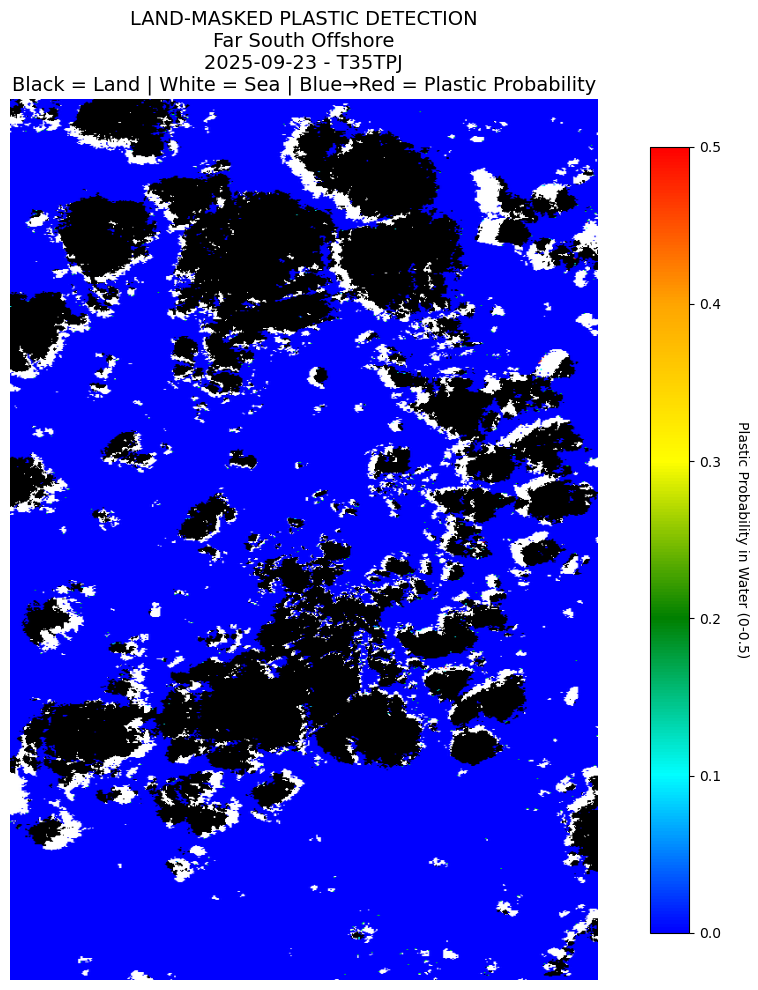


Generating land-masked heatmap: Far South Offshore - 2025-09-23
Saved heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


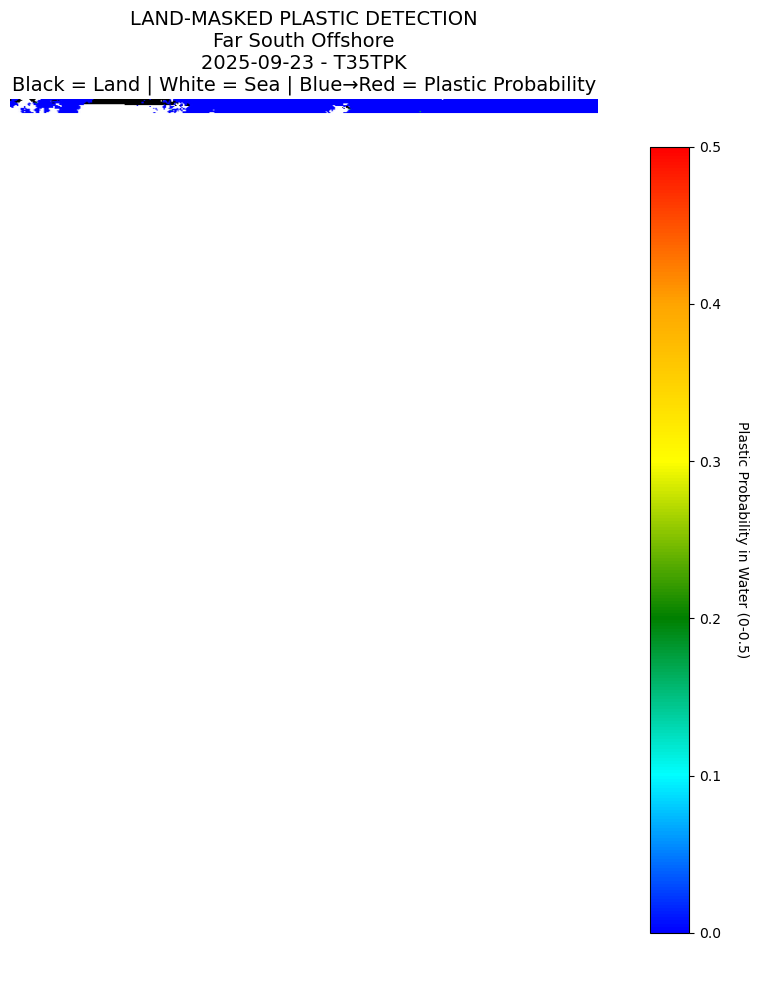


Generating land-masked heatmap: Coastal Transition - Nearshore - 2025-09-23
Saved heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


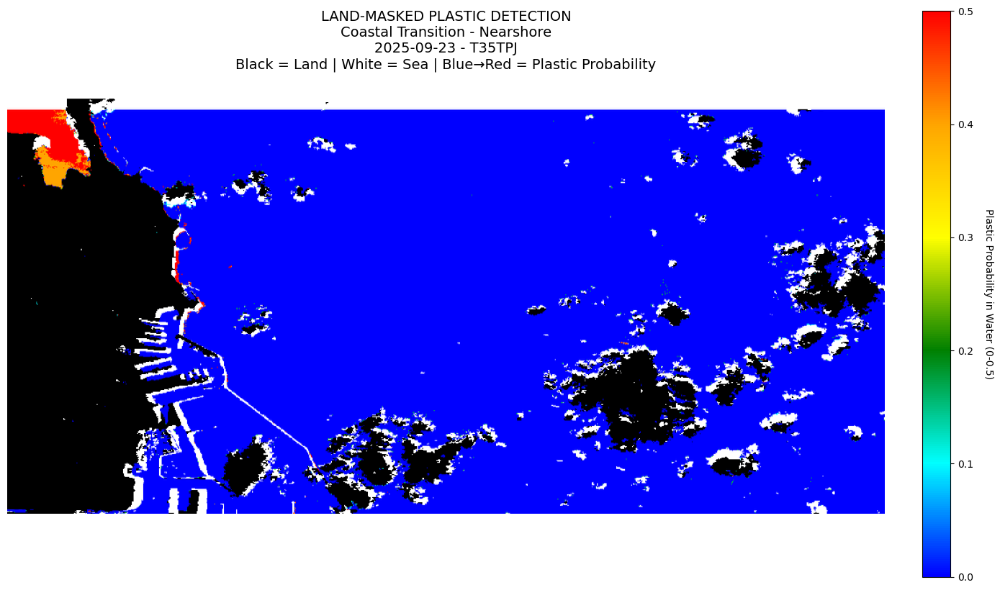


Generating land-masked heatmap: Coastal Transition - Nearshore - 2025-09-23
Saved heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


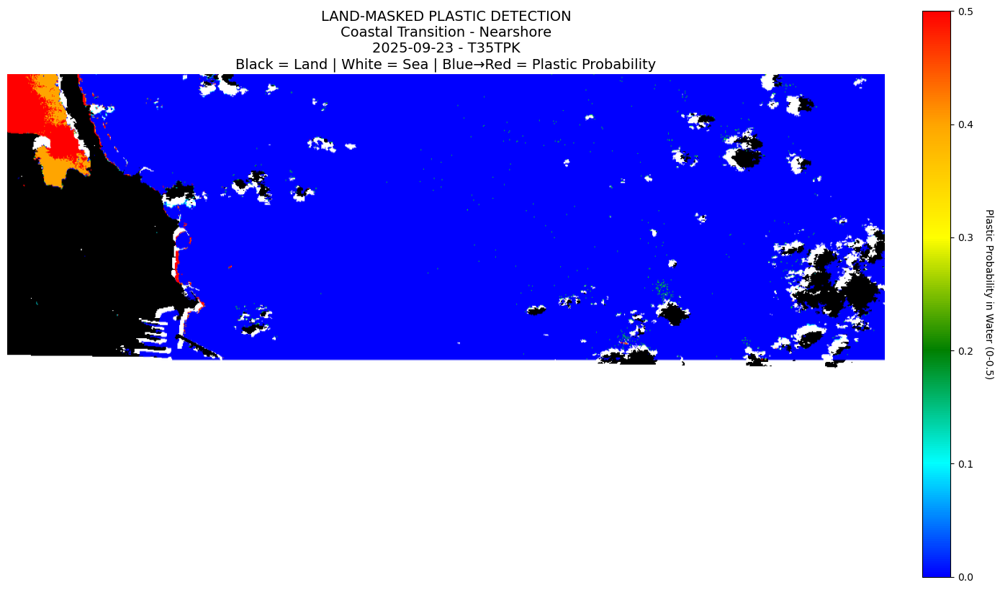


Land-masked heatmap generation: 10/10 successful

🔗 GENERATING COMPOSITE MASKED HEATMAP
Saved composite heatmap: composite_masked_plastic_heatmap.png


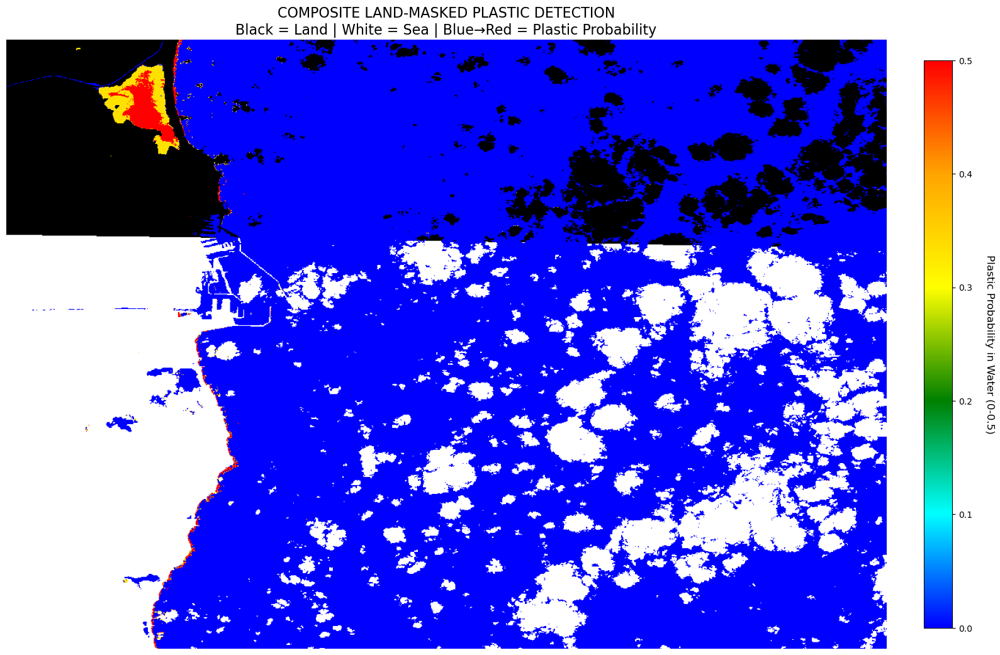


Land-masked plastic detection complete!
All heatmaps saved to: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps
 Black = Land |  White = Sea |  Colored = Plastic Probability


In [13]:
# ==============================
# PLASTIC DETECTION HEATMAP WITH LAND MASKING
# ==============================

from matplotlib.colors import LinearSegmentedColormap
import os, requests, io
from PIL import Image
import matplotlib.pyplot as plt
import ee  # Earth Engine must be initialized

# --- Paths ---
#dataset_path = "/path/to/your/dataset"  # replace with your path

# -----------------------------
# Function: Create single heatmap
# -----------------------------
def create_plastic_heatmap_land_masked(image_data):
    """Create a plastic probability heatmap: land black, sea white, plastic colored on water"""
    segment = image_data['segment']
    print(f"\nGenerating land-masked heatmap: {segment['name']} - {image_data['date']}")
    
    try:
        image = image_data['image']
        
        # --- Water and land masks ---
        ndwi = image.normalizedDifference(['B3', 'B8']).rename('NDWI')
        water_mask = ndwi.gt(0.1)
        land_mask = water_mask.Not()
        
        # --- FDI for plastic detection ---
        fdi = image.expression(
            'B8 - (B11 + (B12 - B11) * ((833 - 664) / (1610 - 664)))',
            {'B8': image.select('B8'), 'B11': image.select('B11'), 'B12': image.select('B12')}
        ).rename('FDI')
        
        # --- Plastic probability ---
        plastic_prob = image.expression(
            '((FDI > 150) * 0.4 + (B8 - B11 > 250) * 0.3 + (B8 / B4 > 1.2) * 0.2 + (B8 > 800) * 0.1)',
            {'B4': image.select('B4'), 'B8': image.select('B8'), 'B11': image.select('B11'), 'FDI': fdi}
        ).rename('plastic_probability').clamp(0, 1)
        
        # --- Base layer: land black, sea white ---
        base = ee.Image(1).where(land_mask, 0)
        
        # --- Overlay: plastic probability only on water ---
        overlay = plastic_prob.updateMask(water_mask)
        
        # --- Heatmap folder ---
        safe_name = segment['name'].replace(' ', '_').replace('-', '_')
        heatmap_path = os.path.join(dataset_path, "plastic_heatmaps", safe_name)
        os.makedirs(heatmap_path, exist_ok=True)
        
        # --- Generate base PNG ---
        base_params = {
            'bands': [base.bandNames().get(0)],
            'min': 0,
            'max': 1,
            'palette': ['000000', 'FFFFFF'],  # black = land, white = sea
            'region': image_data['roi'],
            'dimensions': 1000,
            'format': 'png',
            'transparent': False
        }
        base_url = base.getThumbUrl(base_params)
        base_response = requests.get(base_url, timeout=45)
        base_img = Image.open(io.BytesIO(base_response.content))
        
        # --- Generate overlay PNG ---
        overlay_params = {
            'bands': ['plastic_probability'],
            'min': 0,
            'max': 0.5,
            'palette': ['0000FF', '00FFFF', '00FF00', 'FFFF00', 'FFA500', 'FF0000'],  # plastic colors
            'region': image_data['roi'],
            'dimensions': 1000,
            'format': 'png',
            'transparent': True
        }
        overlay_url = overlay.getThumbUrl(overlay_params)
        overlay_response = requests.get(overlay_url, timeout=45)
        overlay_img = Image.open(io.BytesIO(overlay_response.content))
        
        # --- Resize overlay to match base using Pillow >=10 ---
        overlay_img = overlay_img.convert("RGBA").resize(base_img.size, Image.Resampling.LANCZOS)
        base_img = base_img.convert("RGBA")
        combined = Image.alpha_composite(base_img, overlay_img)
        
        # --- Save heatmap ---
        filename = f"plastic_heatmap_masked_{image_data['date']}_{image_data['tile_id']}.png"
        filepath = os.path.join(heatmap_path, filename)
        combined.save(filepath)
        print(f"Saved heatmap: {filename}")
        
        # --- Display heatmap ---
        plt.figure(figsize=(14, 10))
        plt.imshow(combined)
        plt.title(f"LAND-MASKED PLASTIC DETECTION\n{segment['name']}\n{image_data['date']} - {image_data['tile_id']}\nBlack = Land | White = Sea | Blue→Red = Plastic Probability", fontsize=14)
        plt.axis('off')
        
        # Colorbar for overlay
        water_colors = ['blue', 'cyan', 'green', 'yellow', 'orange', 'red']
        cmap = LinearSegmentedColormap.from_list('water_cmap', water_colors)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, 0.5))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=plt.gca(), fraction=0.03, pad=0.04)
        cbar.set_label('Plastic Probability in Water (0-0.5)', rotation=270, labelpad=20)
        plt.tight_layout()
        plt.show()
        
        return True
    except Exception as e:
        print(f"❌ Heatmap generation error: {e}")
        return False

# -----------------------------
# Function: Composite heatmap
# -----------------------------
def generate_composite_masked_heatmap(all_offshore_data):
    print("\n🔗 GENERATING COMPOSITE MASKED HEATMAP")
    try:
        base_images = []
        overlay_images = []
        for img_data in all_offshore_data:
            image = img_data['image']
            ndwi = image.normalizedDifference(['B3', 'B8']).rename('NDWI')
            water_mask = ndwi.gt(0.1)
            land_mask = water_mask.Not()
            
            fdi = image.expression(
                'B8 - (B11 + (B12 - B11) * ((833 - 664) / (1610 - 664)))',
                {'B8': image.select('B8'), 'B11': image.select('B11'), 'B12': image.select('B12')}
            ).rename('FDI')
            
            plastic_prob = image.expression(
                "((FDI > 150) + (B8 - B11 > 250) + (B8 > 800)) / 3",
                {'FDI': fdi, 'B8': image.select('B8'), 'B11': image.select('B11')}
            ).rename('plastic_prob').clamp(0, 1)
            
            base = ee.Image(1).where(land_mask, 0)
            overlay = plastic_prob.updateMask(water_mask)
            
            base_images.append(base)
            overlay_images.append(overlay)
        
        # Mosaic layers
        composite_base = ee.ImageCollection(base_images).mosaic()
        composite_overlay = ee.ImageCollection(overlay_images).mosaic()
        all_rois = ee.Geometry.MultiPolygon([img_data['roi'] for img_data in all_offshore_data])
        
        # Base PNG
        base_params = {
            'bands': [composite_base.bandNames().get(0)],
            'min': 0,
            'max': 1,
            'palette': ['000000', 'FFFFFF'],
            'region': all_rois,
            'dimensions': 1200,
            'format': 'png',
            'transparent': False
        }
        base_url = composite_base.getThumbUrl(base_params)
        base_response = requests.get(base_url, timeout=60)
        base_img = Image.open(io.BytesIO(base_response.content))
        
        # Overlay PNG
        overlay_params = {
            'bands': ['plastic_prob'],
            'min': 0,
            'max': 0.5,
            'palette': ['0000FF', '00FFFF', '00FF00', 'FFFF00', 'FFA500', 'FF0000'],
            'region': all_rois,
            'dimensions': 1200,
            'format': 'png',
            'transparent': True
        }
        overlay_url = composite_overlay.getThumbUrl(overlay_params)
        overlay_response = requests.get(overlay_url, timeout=60)
        overlay_img = Image.open(io.BytesIO(overlay_response.content))
        
        # Resize overlay to match base
        overlay_img = overlay_img.convert("RGBA").resize(base_img.size, Image.Resampling.LANCZOS)
        base_img = base_img.convert("RGBA")
        combined = Image.alpha_composite(base_img, overlay_img)
        
        # Save composite
        composite_path = os.path.join(dataset_path, "plastic_heatmaps", "composite_masked")
        os.makedirs(composite_path, exist_ok=True)
        filename = "composite_masked_plastic_heatmap.png"
        filepath = os.path.join(composite_path, filename)
        combined.save(filepath)
        print(f"Saved composite heatmap: {filename}")
        
        # Display
        plt.figure(figsize=(16, 12))
        plt.imshow(combined)
        plt.title("COMPOSITE LAND-MASKED PLASTIC DETECTION\nBlack = Land | White = Sea | Blue→Red = Plastic Probability", fontsize=16)
        plt.axis('off')
        water_colors = ['blue', 'cyan', 'green', 'yellow', 'orange', 'red']
        cmap = LinearSegmentedColormap.from_list('water_cmap', water_colors)
        sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, 0.5))
        sm.set_array([])
        cbar = plt.colorbar(sm, ax=plt.gca(), fraction=0.03, pad=0.04)
        cbar.set_label('Plastic Probability in Water (0-0.5)', rotation=270, labelpad=25, fontsize=12)
        plt.tight_layout()
        plt.show()
        
        return True
    except Exception as e:
        print(f"❌ Composite heatmap error: {e}")
        return False

# -----------------------------
# Generate heatmaps
# -----------------------------
print("Creating land-masked plastic detection heatmaps...")
heatmap_success = 0
for image_data in all_offshore_data:
    if create_plastic_heatmap_land_masked(image_data):
        heatmap_success += 1
print(f"\nLand-masked heatmap generation: {heatmap_success}/{len(all_offshore_data)} successful")

if len(all_offshore_data) > 1:
    generate_composite_masked_heatmap(all_offshore_data)

print("\nLand-masked plastic detection complete!")
print(f"All heatmaps saved to: {os.path.join(dataset_path, 'plastic_heatmaps')}")
print(" Black = Land |  White = Sea |  Colored = Plastic Probability")


In [24]:
# ==============================
# PLASTIC DETECTION HEATMAP WITH LAND MASKING + GPS COORDINATES
# ==============================

import os
import io
import json
import requests
import pandas as pd
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap
from sklearn.cluster import DBSCAN
import ee
# -----------------------------
# Function: Create single heatmap + CSV of high-plastic points + clusters
# -----------------------------
def create_plastic_heatmap_land_masked(image_data, dataset_path, red_threshold=0.4):
    """Create heatmap visualization with land masking and export GPS coordinates"""
    segment = image_data['segment']
    print(f"\n Generating land-masked heatmap: {segment['name']} - {image_data['date']}")

    try:
        # Apply MARLISAT-inspired plastic detection algorithm
        image = image_data['image']

        # Calculate indices for plastic detection
        ndwi = image.normalizedDifference(['B3', 'B8']).rename('NDWI')  # Water mask
        water_mask = ndwi.gt(0.1).rename('water_mask')  # robust water mask

        # Floating Debris Index (FDI)
        fdi = image.expression(
            'B8 - (B11 + (B12 - B11) * ((833 - 664) / (1610 - 664)))',
            {'B8': image.select('B8'), 'B11': image.select('B11'), 'B12': image.select('B12')}
        ).rename('FDI')

        # Plastic detection probability
        plastic_probability = image.expression(
            '((FDI > 150) * 0.4 + '
            '(B8 - B11 > 250) * 0.3 + '
            '(B8 / B4 > 1.2) * 0.2 + '
            '(B8 > 800) * 0.1)',
            {'B4': image.select('B4'),
             'B8': image.select('B8'),
             'B11': image.select('B11'),
             'FDI': fdi}
        ).rename('plastic_probability').clamp(0, 1)

        # Apply water mask to remove land
        plastic_probability_masked = plastic_probability.updateMask(water_mask)

        # Output folder
        safe_name = segment['name'].replace(' ', '_').replace('-', '_')
        heatmap_path = os.path.join(dataset_path, "plastic_heatmaps", safe_name)
        os.makedirs(heatmap_path, exist_ok=True)

        # Generate heatmap visualization
        heatmap_params = {
            'bands': ['plastic_probability'],
            'min': 0,
            'max': 0.5,
            'palette': ['FFFFFF', 'blue', 'cyan', 'green', 'yellow', 'orange', 'red'],  # White sea, black=land masked
            'region': image_data['roi'],
            'dimensions': 1000,
            'format': 'png'
        }

        url = plastic_probability_masked.getThumbUrl(heatmap_params)
        response = requests.get(url, timeout=45)

        if response.status_code == 200:
            # Save heatmap
            filename = f"plastic_heatmap_masked_{image_data['date']}_{image_data['tile_id']}.png"
            filepath = os.path.join(heatmap_path, filename)
            with open(filepath, 'wb') as f:
                f.write(response.content)

            print(f"    Saved land-masked heatmap: {filename}")

            # Display the heatmap
            img = Image.open(io.BytesIO(response.content))
            plt.figure(figsize=(14, 10))
            plt.imshow(img)
            plt.title(f"LAND-MASKED PLASTIC DETECTION\n{segment['name']}\n"
                      f"{image_data['date']} - {image_data['tile_id']}\n"
                      f"Black = Land | White = Water | Blue→Red = Plastic Probability", fontsize=14)
            plt.axis('off')

            # Add colorbar legend
            water_colors = ['blue', 'cyan', 'green', 'yellow', 'orange', 'red']
            cmap = LinearSegmentedColormap.from_list('water_cmap', water_colors)
            sm = plt.cm.ScalarMappable(cmap=cmap, norm=plt.Normalize(0, 0.5))
            sm.set_array([])
            cbar = plt.colorbar(sm, ax=plt.gca(), fraction=0.03, pad=0.04)
            cbar.set_label('Plastic Probability in Water (0-0.5)', rotation=270, labelpad=20)
            plt.tight_layout()
            plt.show()

            # --- Extract raw red pixel coordinates ---
            high_plastic = plastic_probability_masked.gt(red_threshold).selfMask().rename("plastic_mask")
            red_points = high_plastic.reduceToVectors(
                geometry=image_data['roi'],
                scale=10,
                geometryType='centroid',
                eightConnected=False,
                labelProperty='class',
                bestEffort=True
            )

            features = red_points.getInfo()['features']
            coords = []
            for f in features:
                lon, lat = f['geometry']['coordinates']
                coords.append({'lon': lon, 'lat': lat})

            if coords:
                # Save raw points
                raw_csv = os.path.join(heatmap_path, f"high_plastic_coords_{image_data['date']}_{image_data['tile_id']}.csv")
                df_raw = pd.DataFrame(coords)
                df_raw.to_csv(raw_csv, index=False)
                print(f"    Saved {len(coords)} raw high-plastic points: {raw_csv}")

                # --- Cluster coordinates into hotspots ---
                X = np.array([[c['lon'], c['lat']] for c in coords])
                kms_per_radian = 6371.0088
                epsilon = 1.0 / kms_per_radian  # 1 km radius
                db = DBSCAN(eps=epsilon, min_samples=5, metric='haversine').fit(np.radians(X))

                labels = db.labels_
                unique_labels = set(labels) - {-1}  # remove noise

                cluster_results = []
                for label in unique_labels:
                    cluster_points = X[labels == label]
                    centroid_lon = cluster_points[:, 0].mean()
                    centroid_lat = cluster_points[:, 1].mean()
                    cluster_size = len(cluster_points)
                    cluster_results.append({
                        "cluster_id": int(label),
                        "lon": centroid_lon,
                        "lat": centroid_lat,
                        "count": cluster_size
                    })

                cluster_results = sorted(cluster_results, key=lambda x: x["count"], reverse=True)

                cluster_csv = os.path.join(heatmap_path, f"plastic_clusters_{image_data['date']}_{image_data['tile_id']}.csv")
                df_clusters = pd.DataFrame(cluster_results)
                df_clusters.to_csv(cluster_csv, index=False)
                print(f"    Saved {len(cluster_results)} clusters: {cluster_csv}")
            else:
                print("    No high-probability plastic pixels found.")

            return True
        else:
            print(f"   ❌ Failed to generate masked heatmap")
            return False

    except Exception as e:
        print(f"   ❌ Heatmap generation error: {e}")
        return False


# === DRIVER CODE ===
def generate_all_heatmaps(all_offshore_data, dataset_path):
    print(" Creating land-masked plastic detection heatmaps...")
    heatmap_success = 0
    for image_data in all_offshore_data:
        success = create_plastic_heatmap_land_masked(image_data, dataset_path)
        if success:
            heatmap_success += 1
    print(f"\n Land-masked heatmap generation: {heatmap_success}/{len(all_offshore_data)} successful")
    print(f" All heatmaps and CSVs saved to: {os.path.join(dataset_path, 'plastic_heatmaps')}")

 Creating land-masked plastic detection heatmaps...

 Generating land-masked heatmap: North Offshore - Mamaia Deep - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


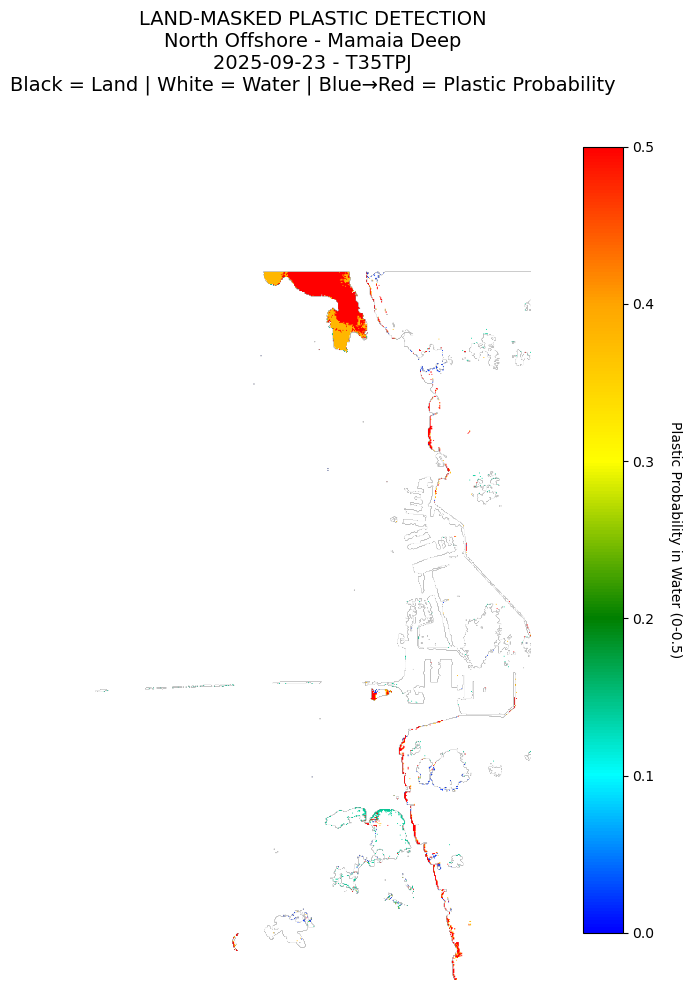

    Saved 1633 raw high-plastic points: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\North_Offshore___Mamaia_Deep\high_plastic_coords_2025-09-23_T35TPJ.csv
    Saved 5 clusters: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\North_Offshore___Mamaia_Deep\plastic_clusters_2025-09-23_T35TPJ.csv

 Generating land-masked heatmap: North Offshore - Mamaia Deep - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


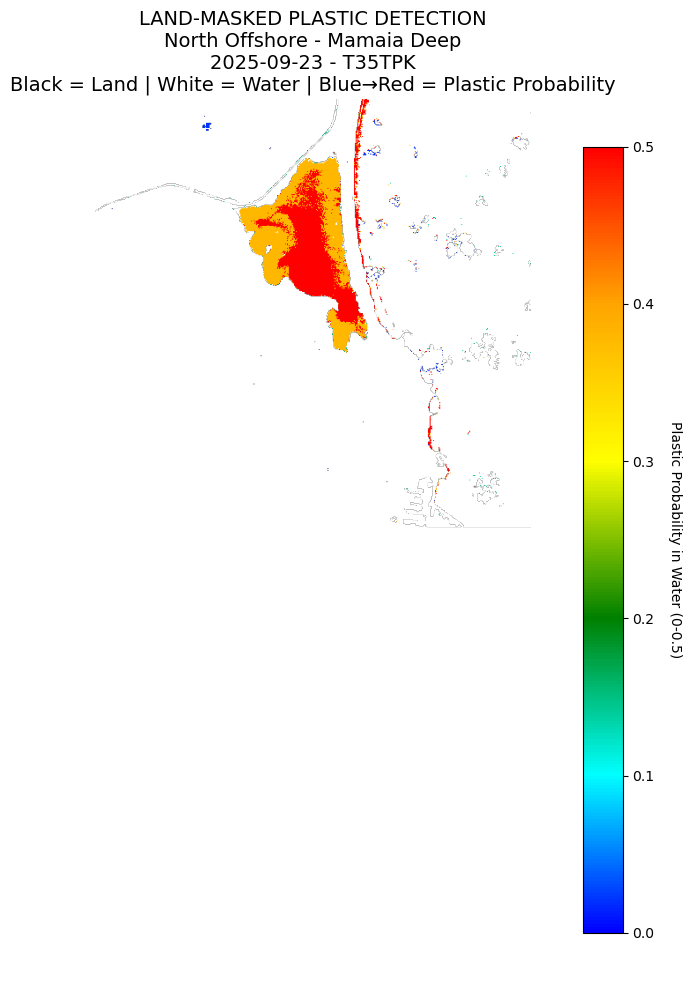

    Saved 3143 raw high-plastic points: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\North_Offshore___Mamaia_Deep\high_plastic_coords_2025-09-23_T35TPK.csv
    Saved 4 clusters: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\North_Offshore___Mamaia_Deep\plastic_clusters_2025-09-23_T35TPK.csv

 Generating land-masked heatmap: Central Offshore - Port Approach - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


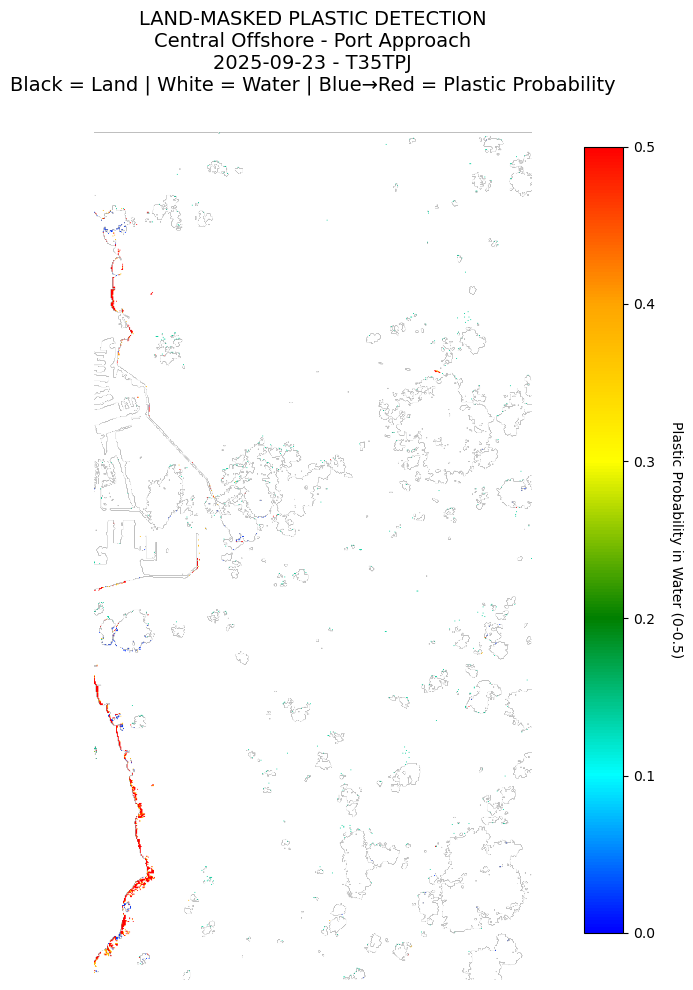

    Saved 972 raw high-plastic points: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\Central_Offshore___Port_Approach\high_plastic_coords_2025-09-23_T35TPJ.csv
    Saved 11 clusters: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\Central_Offshore___Port_Approach\plastic_clusters_2025-09-23_T35TPJ.csv

 Generating land-masked heatmap: Central Offshore - Port Approach - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


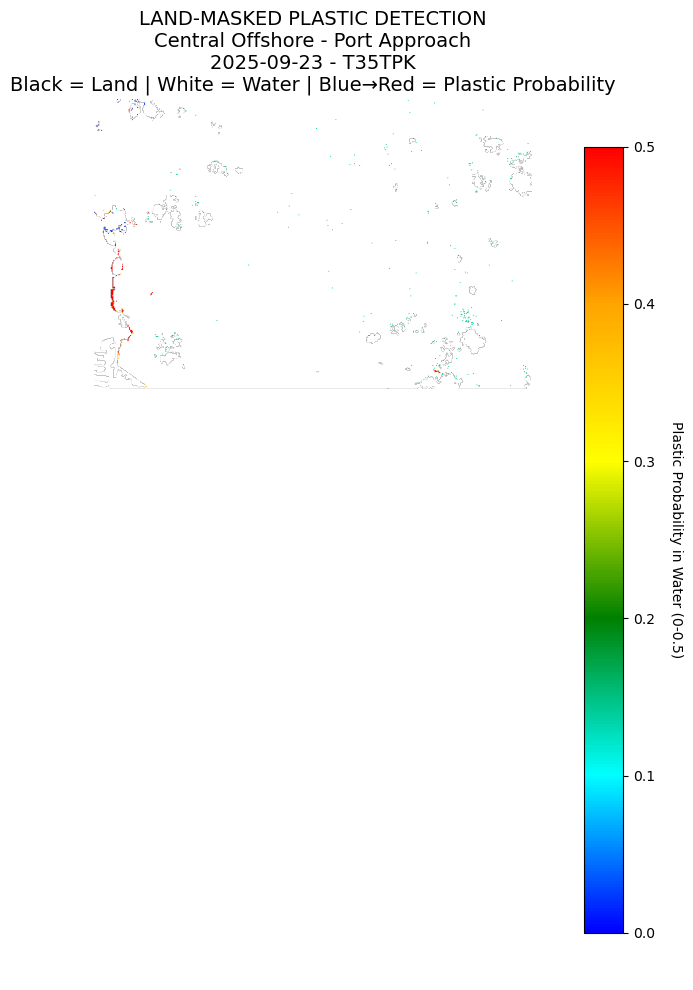

    Saved 250 raw high-plastic points: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\Central_Offshore___Port_Approach\high_plastic_coords_2025-09-23_T35TPK.csv
    Saved 5 clusters: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\Central_Offshore___Port_Approach\plastic_clusters_2025-09-23_T35TPK.csv

 Generating land-masked heatmap: South Offshore - Eforie Deep - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


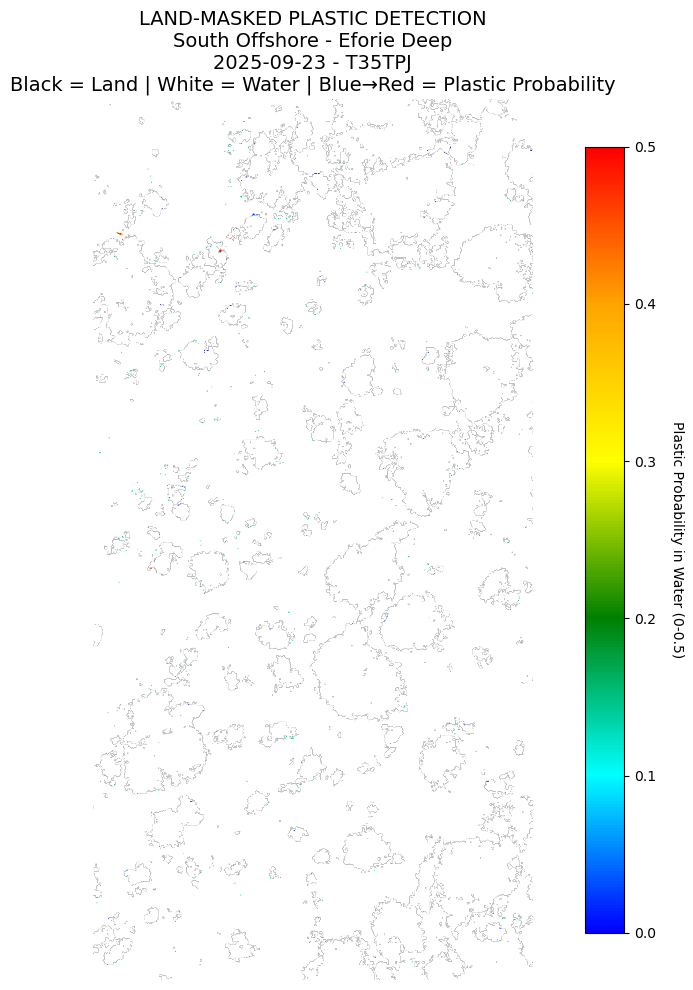

    Saved 66 raw high-plastic points: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\South_Offshore___Eforie_Deep\high_plastic_coords_2025-09-23_T35TPJ.csv
    Saved 4 clusters: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\South_Offshore___Eforie_Deep\plastic_clusters_2025-09-23_T35TPJ.csv

 Generating land-masked heatmap: South Offshore - Eforie Deep - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


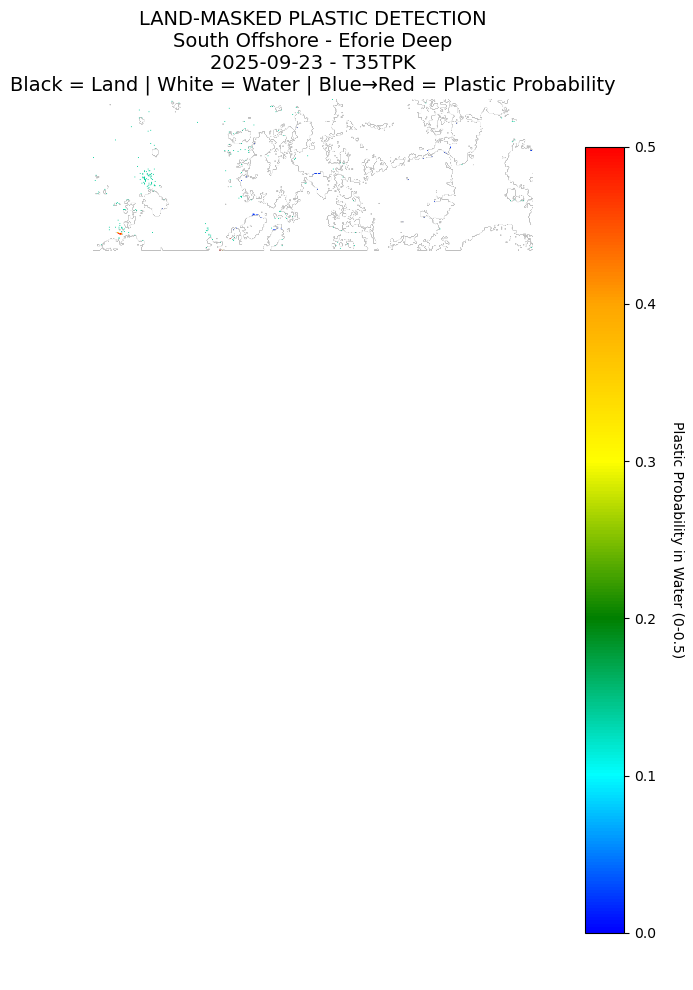

    Saved 26 raw high-plastic points: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\South_Offshore___Eforie_Deep\high_plastic_coords_2025-09-23_T35TPK.csv
    Saved 2 clusters: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\South_Offshore___Eforie_Deep\plastic_clusters_2025-09-23_T35TPK.csv

 Generating land-masked heatmap: Far South Offshore - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


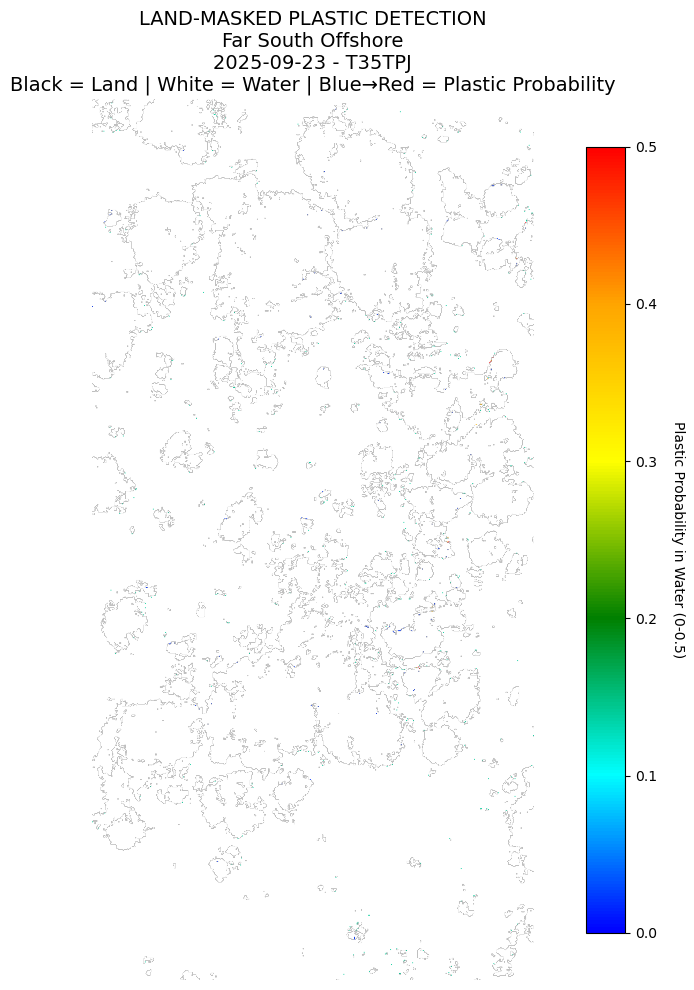

    Saved 92 raw high-plastic points: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\Far_South_Offshore\high_plastic_coords_2025-09-23_T35TPJ.csv
    Saved 6 clusters: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\Far_South_Offshore\plastic_clusters_2025-09-23_T35TPJ.csv

 Generating land-masked heatmap: Far South Offshore - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


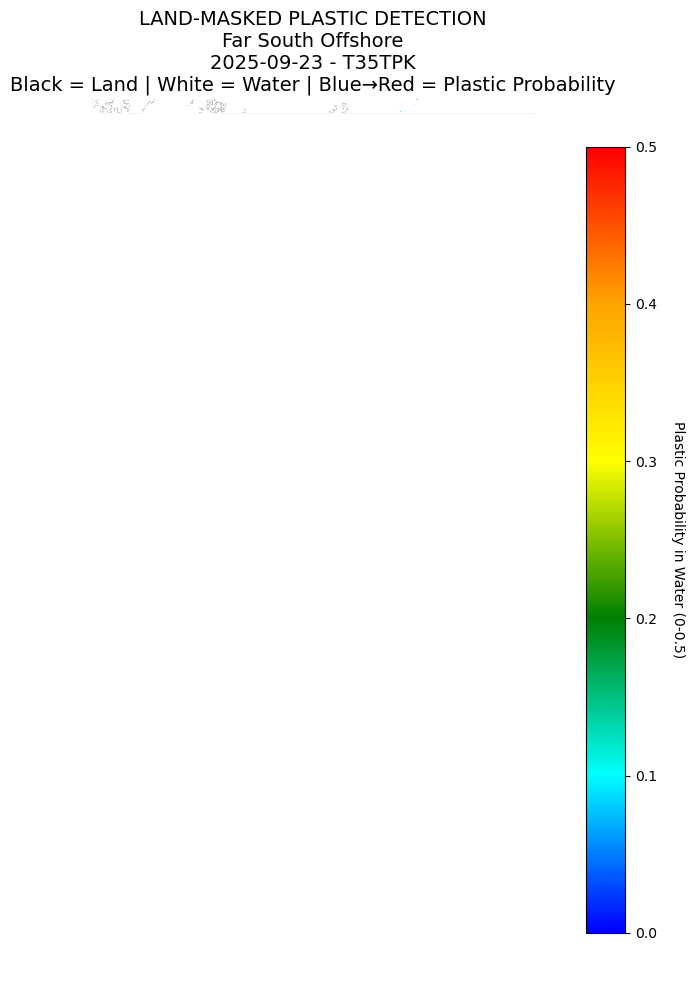

    No high-probability plastic pixels found.

 Generating land-masked heatmap: Coastal Transition - Nearshore - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPJ.png


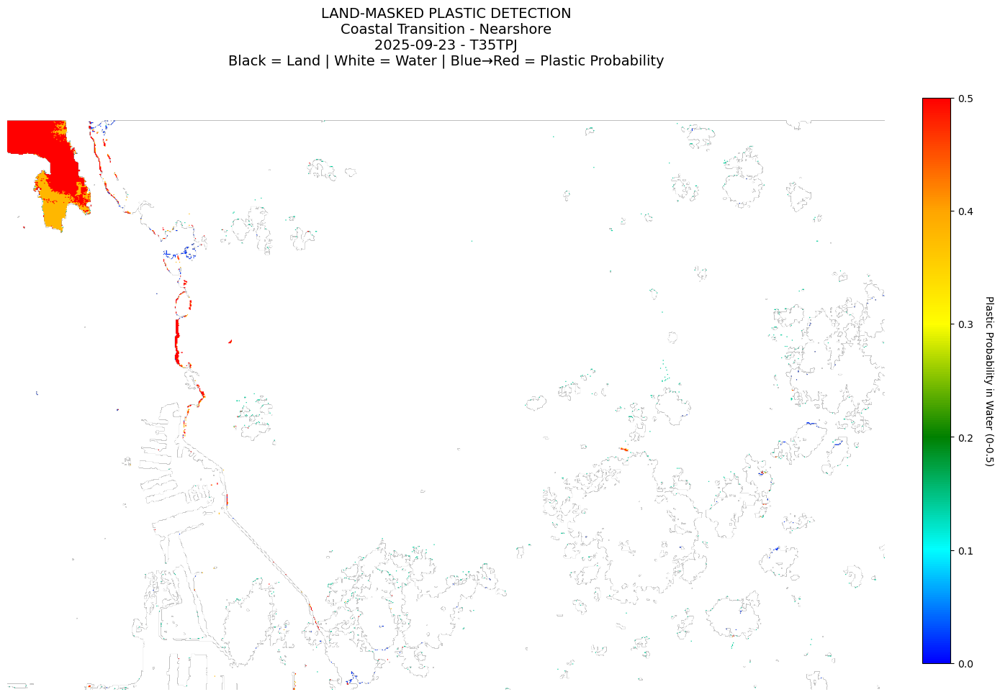

    Saved 987 raw high-plastic points: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\Coastal_Transition___Nearshore\high_plastic_coords_2025-09-23_T35TPJ.csv
    Saved 9 clusters: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\Coastal_Transition___Nearshore\plastic_clusters_2025-09-23_T35TPJ.csv

 Generating land-masked heatmap: Coastal Transition - Nearshore - 2025-09-23
    Saved land-masked heatmap: plastic_heatmap_masked_2025-09-23_T35TPK.png


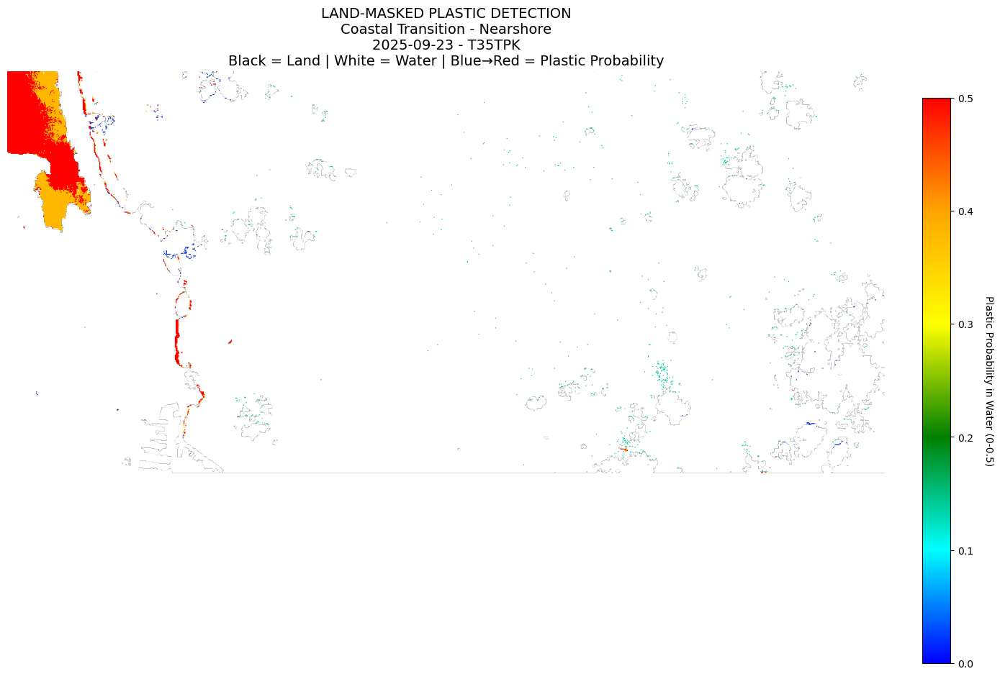

    Saved 1046 raw high-plastic points: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\Coastal_Transition___Nearshore\high_plastic_coords_2025-09-23_T35TPK.csv
    Saved 6 clusters: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps\Coastal_Transition___Nearshore\plastic_clusters_2025-09-23_T35TPK.csv

 Land-masked heatmap generation: 10/10 successful
 All heatmaps and CSVs saved to: D:\Recycllux\Recycllux_projects\recycllux_cv\google_earth_engine\marlisat_dataset_24sept\plastic_heatmaps


In [26]:
# Example: run for all your images
generate_all_heatmaps(all_offshore_data, dataset_path)
